In [1]:
import keras
from keras.models import load_model, model_from_json

Using TensorFlow backend.


In [2]:
import tensorflow as tf

def multinomial_nll(true_counts, logits):
    """Compute the multinomial negative log-likelihood
    Args:
      true_counts: observed count values
      logits: predicted logit values
    """
    counts_per_example = tf.reduce_sum(true_counts, axis=-1)
    dist = tf.contrib.distributions.Multinomial(total_count=counts_per_example,
                                                logits=logits)
    return -tf.reduce_sum(dist.log_prob(true_counts)) / tf.to_float(tf.shape(true_counts)[0])


class MultichannelMultinomialNLL(object):
    def __init__(self, n):
        self.__name__ = "MultichannelMultinomialNLL"
        self.n = n

    def __call__(self, true_counts, logits):
        for i in range(self.n):
            loss = multinomial_nll(true_counts[..., i], logits[..., i])
            if i == 0:
                total = loss
            else:
                total += loss
        return total

    def get_config(self):
        return {"n": self.n}

from keras.utils import CustomObjectScope
from keras.models import load_model
with CustomObjectScope({'MultichannelMultinomialNLL': MultichannelMultinomialNLL}):
    keras_model = load_model("model.h5")

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
Use `tf.cast` instead.



In [3]:
keras_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq (InputLayer)                (None, 1000, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 1000, 64)     6464        seq[0][0]                        
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 1000, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, 1000, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]             

In [4]:
def get_out_tensor(inp_tensor, layer_to_copy, param_overrides={}):
    new_config = dict(layer_to_copy.get_config().items())
    for param_name in param_overrides:
        assert param_name in new_config
        new_config[param_name] = param_overrides[param_name]
    new_layer = layer_to_copy.__class__.from_config(new_config)
    adjusted_input_shape = list(layer_to_copy.input_shape)
    assert len(adjusted_input_shape)==3
    adjusted_input_shape[1] = None #flexible input len for convs
    adjusted_input_shape = tuple(adjusted_input_shape)
    new_layer.build(adjusted_input_shape)
    new_layer.set_weights(layer_to_copy.get_weights())
    out_tensor = new_layer(inp_tensor)
    return out_tensor

In [5]:
inp_tensor = keras.layers.Input((None,4))

conv1_out = get_out_tensor(inp_tensor=inp_tensor,
                           layer_to_copy=keras_model.layers[1],
                           param_overrides={'padding': 'same'})
conv2_out = get_out_tensor(inp_tensor=conv1_out,
                           layer_to_copy=keras_model.layers[2],
                           param_overrides={'padding': 'same'})
add_out = keras.layers.Add()([conv1_out, conv2_out])

convs = [conv1_out, conv2_out]

for i in range(8):
    conv_out = get_out_tensor(inp_tensor=add_out,
                              layer_to_copy=keras_model.layers[4 + 2*i],
                              param_overrides={'padding': 'same'})
    convs.append(conv_out)
    add_out = keras.layers.Add()([add_out, conv_out])

gaps = [keras.layers.GlobalAveragePooling1D()(x) for x in convs]

#conv3_out =  get_out_tensor(inp_tensor=add1_out,
#                            layer_to_copy=keras_model.layers[4],
#                            param_overrides={'padding': 'same'})
#add2_out = keras.layers.Add()([add1_out, conv3_out])
#conv4_out =  get_out_tensor(inp_tensor=add2_out,
#                            layer_to_copy=keras_model.layers[6],
#                            param_overrides={'padding': 'same'})
#add3_out = keras.layers.Add()([add2_out, conv4_out])
#conv5_out =  get_out_tensor(inp_tensor=add3_out,
#                            layer_to_copy=keras_model.layers[8],
#                            param_overrides={'padding': 'same'})

#conv1_gap = keras.layers.GlobalAveragePooling1D()(conv1_out)
#conv2_gap = keras.layers.GlobalAveragePooling1D()(conv2_out)
#conv3_gap = keras.layers.GlobalAveragePooling1D()(conv3_out)
#conv4_gap = keras.layers.GlobalAveragePooling1D()(conv4_out)

concat = keras.layers.Concatenate(axis=-1)(gaps)
embedding_model = keras.models.Model(inputs=inp_tensor, outputs=concat)

In [6]:
embedding_model.save("embedding_model.h5")

In [7]:
import numpy as np
embedding_model.predict(np.random.random((10, 41, 4))).shape

(10, 640)

In [8]:
embedding_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, 4)      0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, None, 64)     6464        input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, None, 64)     12352       conv1d_1[0][0]                   
__________________________________________________________________________________________________
add_1 (Add)                     (None, None, 64)     0           conv1d_1[0][0]                   
                                                                 conv1d_2[0][0]             

In [32]:
import numpy as np
import h5py

f = h5py.File("/oak/stanford/groups/akundaje/avsec/basepair/data/"
              +"processed/comparison/output/nexus,peaks,OSNK,0,10"
              +",1,FALSE,same,0.5,64,25,0.004,9,FALSE,[1,50],TRUE"
              +",FALSE,1/deeplift.imp_score.h5", "r")
#f = h5py.File("/users/avanti/deeplift.imp_score.h5","r")
nanog_mask = np.array(f['metadata']['interval_from_task'][:]=='Nanog')
nanog_profile_wn_hypimp = np.array(f["hyp_imp/Nanog/profile/wn"][:])[nanog_mask]
onehot_seq = np.array(f["inputs/seq"][:])[nanog_mask]
nanog_profile_wn_contribs = nanog_profile_wn_hypimp*onehot_seq

In [33]:
nanog_profile_wn_contribs.shape

(55233, 1000, 4)

In [20]:
#print modisco commit hash
%cd /users/avanti/tfmodisco
!git log -n 1
%cd /users/avanti/tfmodisco_bio_experiments/bpnet/trial1

from importlib import reload

/mnt/lab_data2/avanti/tfmodisco
commit deb9880ff8845bfcc3657a266e1a857059b31fd7 (HEAD -> dev2, origin/dev2)
Author: AvantiShri <avanti.shrikumar@gmail.com>
Date:   Fri Jun 19 11:26:57 2020 -0700

    support for sparse return
/mnt/lab_data2/avanti/tfmodisco_bio_experiments/bpnet/trial1


In [21]:
%matplotlib inline
import h5py
import numpy as np
import modisco
import modisco.cluster.phenograph.core
reload(modisco.cluster.phenograph.core)
import modisco.cluster.phenograph.cluster
reload(modisco.cluster.phenograph.cluster)
import modisco.cluster.phenograph
reload(modisco.cluster.phenograph)
import modisco.cluster.core
reload(modisco.cluster.core)
import modisco.cluster
reload(modisco.cluster)
import modisco.affinitymat.core
reload(modisco.affinitymat.core)
import modisco.affinitymat.transformers
reload(modisco.affinitymat.transformers)
import modisco.tfmodisco_workflow.seqlets_to_patterns
reload(modisco.tfmodisco_workflow.seqlets_to_patterns)
import modisco.tfmodisco_workflow.workflow
reload(modisco.tfmodisco_workflow.workflow)
import modisco.nearest_neighbors
reload(modisco.nearest_neighbors)
import modisco.affinitymat
reload(modisco.affinitymat)
import modisco.aggregator
reload(modisco.aggregator)
import modisco.value_provider
reload(modisco.value_provider)
import modisco.core
reload(modisco.core)
import modisco.coordproducers
reload(modisco.coordproducers)
import modisco.metaclusterers
reload(modisco.metaclusterers)
import modisco.clusterinit.memeinit
reload(modisco.clusterinit.memeinit)

%matplotlib inline

num seqs to use: 1104
On task Nanog_profile_wn
Computing windowed sums on original
Generating null dist
peak(mu)= 0.003840833756548818
Computing threshold
Thresholds from null dist were -0.0166471004486084  and  0.10157325863838196
Final raw thresholds are -0.0166471004486084  and  0.10157325863838196
Final transformed thresholds are -0.519914596273292  and  0.8223334442472642


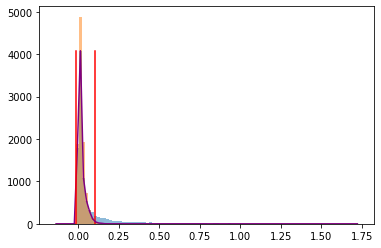

Got 9356 coords
After resolving overlaps, got 9356 seqlets
Across all tasks, the weakest transformed threshold used was: 0.519814596273292
MEMORY 7.753904128
9356 identified in total
Reducing weak_threshold_for_counting_sign to match weakest_transformed_thresh, from 0.8 to 0.519814596273292
2 activity patterns with support >= 100 out of 2 possible patterns
Metacluster sizes:  [8719, 637]
Idx to activities:  {0: '1', 1: '-1'}
MEMORY 7.68784384


In [36]:
import modisco
from collections import OrderedDict
import sys


def print_memory_use():
    import os
    import psutil
    process = psutil.Process(os.getpid())
    print("MEMORY",process.memory_info().rss/1000000000)

frac_seqs_to_use = 0.02
NUM_SEQS_TO_USE = int(frac_seqs_to_use*len(nanog_profile_wn_contribs))
print("num seqs to use:", NUM_SEQS_TO_USE)

task_names=["Nanog_profile_wn"]
contrib_scores={'Nanog_profile_wn':
                 nanog_profile_wn_contribs[:NUM_SEQS_TO_USE]}
hypothetical_contribs={'Nanog_profile_wn':
                       nanog_profile_wn_hypimp[:NUM_SEQS_TO_USE]}
one_hot=onehot_seq[:NUM_SEQS_TO_USE]
#null_tracks should either be a dictionary
# from task_name to 1d trakcs, or a callable
null_per_pos_scores = modisco.coordproducers.LaplaceNullDist(
    num_to_samp=10000)
revcomp = True
plot_save_dir = "figures"

sliding_window_size = 21
flank_size = 10
histogram_bins = 100
percentiles_in_bandwidth = 10
overlap_portion = 0.5
min_metacluster_size = 100
min_metacluster_size_frac = 0.01
weak_threshold_for_counting_sign = 0.8
target_seqlet_fdr = 0.2
min_passing_windows_frac = 0.03
max_passing_windows_frac = 0.2
separate_pos_neg_thresholds = False
verbose = True
min_seqlets_per_task = None
other_tracks = []
#reducing from 50000 to 10000 for debugging purposes
max_seqlets_per_metacluster = 10000 #50000

overlap_resolver = modisco.core.SeqletsOverlapResolver(
    overlap_detector=modisco.core.CoordOverlapDetector(overlap_portion),
    seqlet_comparator=modisco.core.SeqletComparator(
       value_provider=
        modisco.value_provider.CoorScoreValueProvider()))

coord_producer = modisco.coordproducers.FixedWindowAroundChunks(
    sliding=sliding_window_size,
    flank=flank_size,
    suppress=(int(0.5*sliding_window_size)
              + flank_size),
    target_fdr=target_seqlet_fdr,
    min_passing_windows_frac=min_passing_windows_frac,
    max_passing_windows_frac=max_passing_windows_frac,
    separate_pos_neg_thresholds=separate_pos_neg_thresholds,
    max_seqlets_total=None,
    verbose=verbose,
    plot_save_dir=plot_save_dir) 

track_set = (modisco.tfmodisco_workflow.workflow.prep_track_set(
    task_names=task_names,
    contrib_scores=contrib_scores,
    hypothetical_contribs=hypothetical_contribs,
    one_hot=one_hot,
    revcomp=revcomp,
    other_tracks=other_tracks))

per_position_contrib_scores = OrderedDict([
    (x, [np.sum(s,axis=1) for s in contrib_scores[x]])
    for x in task_names])

multitask_seqlet_creation_results = modisco.core.MultiTaskSeqletCreator(
    coord_producer=coord_producer,
    overlap_resolver=overlap_resolver)(
        task_name_to_score_track=per_position_contrib_scores,
        null_tracks=null_per_pos_scores,
        track_set=track_set)

#find the weakest transformed threshold used across all tasks
weakest_transformed_thresh = (min(
    [min(x.tnt_results.transformed_pos_threshold,
         abs(x.tnt_results.transformed_neg_threshold))
         for x in (multitask_seqlet_creation_results.
                   task_name_to_coord_producer_results.values())]) -
    0.0001) #subtract 1e-4 to avoid weird numerical issues
print("Across all tasks, the weakest transformed threshold used"
      +" was: "+str(weakest_transformed_thresh))
print_memory_use()

all_seqlets = multitask_seqlet_creation_results.final_seqlets
print(str(len(all_seqlets))+" identified in total")
if (len(all_seqlets) < 100):
    print("WARNING: you found relatively few seqlets."
          +" Consider dropping target_seqlet_fdr") 

if int(min_metacluster_size_frac * len(all_seqlets)) > min_metacluster_size:
    print("min_metacluster_size_frac * len(seqlets) = {0} is more than min_metacluster_size={1}.".\
          format(int(min_metacluster_size_frac * len(all_seqlets)), min_metacluster_size))
    print("Using it as a new min_metacluster_size")
    min_metacluster_size = int(min_metacluster_size_frac * len(all_seqlets))

weak_threshold_for_counting_sign=0.8
if (weak_threshold_for_counting_sign is None):
    weak_threshold_for_counting_sign = weakest_transformed_thresh
else:
    weak_threshold_for_counting_sign =\
        weak_threshold_for_counting_sign
    
if (weak_threshold_for_counting_sign > weakest_transformed_thresh):
    print("Reducing weak_threshold_for_counting_sign to"
          +" match weakest_transformed_thresh, from "
          +str(weak_threshold_for_counting_sign)
          +" to "+str(weakest_transformed_thresh))
    weak_threshold_for_counting_sign = weakest_transformed_thresh

task_name_to_value_provider = OrderedDict([
    (task_name,
     modisco.value_provider.TransformCentralWindowValueProvider(
        track_name=task_name+"_contrib_scores",
        central_window=sliding_window_size,
        val_transformer= 
         coord_producer_results.tnt_results.val_transformer))
     for (task_name,coord_producer_results)
         in (multitask_seqlet_creation_results.
             task_name_to_coord_producer_results.items())])

min_metacluster_size=100
metaclusterer = modisco.metaclusterers.SignBasedPatternClustering(
                        min_cluster_size=min_metacluster_size,
                        task_name_to_value_provider=
                            task_name_to_value_provider,
                        task_names=task_names,
                        threshold_for_counting_sign=
                            weakest_transformed_thresh,
                        weak_threshold_for_counting_sign=
                            weak_threshold_for_counting_sign)

metaclustering_results = metaclusterer.fit_transform(all_seqlets)
metacluster_indices = np.array(
    metaclustering_results.metacluster_indices)
metacluster_idx_to_activity_pattern =\
    metaclustering_results.metacluster_idx_to_activity_pattern

num_metaclusters = max(metacluster_indices)+1
metacluster_sizes = [np.sum(metacluster_idx==metacluster_indices)
                      for metacluster_idx in range(num_metaclusters)]
if (verbose):
    print("Metacluster sizes: ",metacluster_sizes)
    print("Idx to activities: ",metacluster_idx_to_activity_pattern)
    print_memory_use()
    sys.stdout.flush()

In [41]:
metacluster_idx = 0
metacluster_size = metacluster_sizes[metacluster_idx]
print("On metacluster "+str(metacluster_idx))                       
if (max_seqlets_per_metacluster is None                        
    or max_seqlets_per_metacluster >= metacluster_size):       
    print("Metacluster size", metacluster_size)                     
else:                                                               
    print("Metacluster size {0} limited to {1}".format(             
            metacluster_size, max_seqlets_per_metacluster))    
sys.stdout.flush()                                                  
metacluster_activities = [                                          
    int(x) for x in                                                 
    metacluster_idx_to_activity_pattern[metacluster_idx].split(",")]
assert len(all_seqlets)==len(metacluster_indices)                       
metacluster_seqlets = [                                             
    x[0] for x in zip(all_seqlets, metacluster_indices)                 
    if x[1]==metacluster_idx][:max_seqlets_per_metacluster]    
relevant_task_names, relevant_task_signs =\
    zip(*[(x[0], x[1]) for x in                                     
        zip(task_names, metacluster_activities) if x[1] != 0])      
print('Relevant tasks: ', relevant_task_names)                      
print('Relevant signs: ', relevant_task_signs)                      
sys.stdout.flush()                                                  
if (len(relevant_task_names) == 0):                                 
    assert False, "This should not happen"                          
    sys.stdout.flush()                                              

onehot_track_name="sequence"
contrib_scores_track_names = [key+"_contrib_scores" for key in relevant_task_names]
hypothetical_contribs_track_names= [key+"_hypothetical_contribs" for key in relevant_task_names]                
track_signs=relevant_task_signs                              
other_comparison_track_names=[]

assert len(track_signs)==len(hypothetical_contribs_track_names)         
assert len(track_signs)==len(contrib_scores_track_names)                
                                                                                
seqlets_sorter = (lambda arr:                                           
                          sorted(arr,                                           
                                 key=lambda x:                                  
                                  -np.sum([np.sum(np.abs(x[track_name].fwd))    
                                     for track_name                             
                                     in contrib_scores_track_names])))

min_overlap_while_sliding = 0.7
pattern_comparison_settings =\
            modisco.affinitymat.core.PatternComparisonSettings(                         
                track_names=hypothetical_contribs_track_names                   
                            +contrib_scores_track_names                         
                            +other_comparison_track_names,                      
                track_transformer=modisco.affinitymat.L1Normalizer(),                   
                min_overlap=min_overlap_while_sliding)

#coarse_grained 1d embedder   
embedder_factory=(modisco.seqlet_embedding
                          .onehot_model_output.KerasModelOutputEmbedder
                          .get_factory(model_h5="embedding_model.h5"))
seqlets_to_1d_embedder = embedder_factory(                         
        onehot_track_name=onehot_track_name,                            
        toscore_track_names_and_signs=list(                             
        zip(hypothetical_contribs_track_names,                          
            [np.sign(x) for x in track_signs])))

#affinity matrix from embeddings                                        
coarse_affmat_computer =\
    modisco.affinitymat.core.AffmatFromSeqletEmbeddings(                        
        seqlets_to_1d_embedder=seqlets_to_1d_embedder,                  
        affinity_mat_from_1d=\
            modisco.affinitymat.core.NumpyCosineSimilarity(                     
                verbose=True,                                   
                gpu_batch_size=None),                                   
        verbose=True)                                           

affmat_from_seqlets_with_nn_pairs =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(                      
        pattern_comparison_settings=pattern_comparison_settings,        
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(           
                n_cores=10,                                   
                cross_metric_single_region=                             
                    modisco.affinitymat.core.CrossContinJaccardSingleRegion()))

seqlets = seqlets_sorter(metacluster_seqlets)
print("Computing coarse affmat", flush=True)
coarse_affmat = coarse_affmat_computer(seqlets)
print("Computing seqlet neighbors from coarse", flush=True)
seqlet_neighbors = (modisco.tfmodisco_workflow.seqlets_to_patterns
    .get_seqlet_neighbors_with_initcluster(       
        nearest_neighbors_to_compute=500,                         
        coarse_affmat=coarse_affmat,                                
        initclusters=None))
print("Computing fine-grained", flush=True)
affmat_from_seqlets_with_nn_pairs_argmax =\
    modisco.affinitymat.core.AffmatFromSeqletsWithNNpairs(
        pattern_comparison_settings=pattern_comparison_settings,
        sim_metric_on_nn_pairs=\
            modisco.affinitymat.core.ParallelCpuCrossMetricOnNNpairs(
                n_cores=10,
                cross_metric_single_region=
                    modisco.affinitymat.core.CrossContinJaccardSingleRegionWithArgmax()))

sparse_nn_affmat_withargmax = affmat_from_seqlets_with_nn_pairs_argmax(
    seqlet_neighbors=seqlet_neighbors,
    seqlets=seqlets,
    return_sparse=True)

On metacluster 0
Metacluster size 8719
Relevant tasks:  ('Nanog_profile_wn',)
Relevant signs:  (1,)
Computing coarse affmat
Beginning embedding computation
Finished embedding computation in 9.4 s
Starting affinity matrix computations
Normalization computed in 0.09 s
Cosine similarity mat computed in 1.38 s
Normalization computed in 0.06 s
Cosine similarity mat computed in 1.3 s
Finished affinity matrix computations in 3.55 s
Computing seqlet neighbors from coarse
Computing fine-grained
Launching nearest neighbors affmat calculation job
MEMORY 8.225087488
Parallel runs completed
MEMORY 8.23148544
Job completed in: 57.69 s
MEMORY 8.113934336
Launching nearest neighbors affmat calculation job
MEMORY 8.113934336
Parallel runs completed
MEMORY 8.134836224
Job completed in: 57.59 s
MEMORY 8.134836224


In [42]:
#coarse_grained 1d embedder   
gkm_embedder_factory=(modisco.seqlet_embedding
                          .gapped_kmer.GappedKmerEmbedderFactory())
gkm_seqlets_to_1d_embedder = gkm_embedder_factory(                         
        onehot_track_name=onehot_track_name,                            
        toscore_track_names_and_signs=list(                             
        zip(hypothetical_contribs_track_names,                          
            [np.sign(x) for x in track_signs])))

#affinity matrix from embeddings                                        
gkm_coarse_affmat_computer =\
    modisco.affinitymat.core.AffmatFromSeqletEmbeddings(                        
        seqlets_to_1d_embedder=gkm_seqlets_to_1d_embedder,                  
        affinity_mat_from_1d=\
            modisco.affinitymat.core.NumpyCosineSimilarity(                     
                verbose=True,                                   
                gpu_batch_size=None),                                   
        verbose=True) 
gkm_coarse_affmat = gkm_coarse_affmat_computer(seqlets)

gkm_seqlet_neighbors = (modisco.tfmodisco_workflow.seqlets_to_patterns
    .get_seqlet_neighbors_with_initcluster(       
        nearest_neighbors_to_compute=500,                         
        coarse_affmat=gkm_coarse_affmat,                                
        initclusters=None))

gkm_sparse_nn_affmat_withargmax = affmat_from_seqlets_with_nn_pairs_argmax(
    seqlet_neighbors=gkm_seqlet_neighbors,
    seqlets=seqlets,
    return_sparse=True)

Beginning embedding computation
Computing embeddings
Finished embedding computation in 96.3 s
Starting affinity matrix computations
Normalization computed in 9.0 s
Cosine similarity mat computed in 112.17 s
Normalization computed in 8.28 s
Cosine similarity mat computed in 106.59 s
Finished affinity matrix computations in 219.84 s
Launching nearest neighbors affmat calculation job
MEMORY 9.219981312
Parallel runs completed
MEMORY 9.219989504
Job completed in: 57.56 s
MEMORY 9.219989504
Launching nearest neighbors affmat calculation job
MEMORY 9.219989504
Parallel runs completed
MEMORY 9.224085504
Job completed in: 57.58 s
MEMORY 9.224085504


In [43]:
import scipy


def reconstitute_dense_affmat(sparse_affmat_withargmax, seqlet_neighbors):
    to_return = np.zeros((len(seqlet_neighbors), len(seqlet_neighbors)))
    for row_idx, (neighbors, affinitieswithargmax) in enumerate(zip(seqlet_neighbors, sparse_affmat_withargmax)):
        affinities = affinitieswithargmax[:,0]
        for col_idx, val in zip(neighbors, affinities):
            to_return[row_idx, col_idx] = val
    return to_return


def get_correlations(main_affmat, other_affmat):
    correlations = []
    for main_affmat_row, other_affmat_row\
        in zip(main_affmat, other_affmat):
        #compare correlation on the nonzero rows
        to_compare_mask = np.abs(main_affmat_row) > 0
        corr = scipy.stats.spearmanr(
                main_affmat_row[to_compare_mask],
                other_affmat_row[to_compare_mask])
        correlations.append(corr.correlation)
    correlations = np.array(correlations)
    return correlations


correlations = get_correlations(main_affmat=reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=seqlet_neighbors),
                                other_affmat=coarse_affmat)
gkm_correlations = get_correlations(main_affmat=reconstitute_dense_affmat(
                                    sparse_affmat_withargmax=gkm_sparse_nn_affmat_withargmax,
                                    seqlet_neighbors=gkm_seqlet_neighbors),
                                other_affmat=gkm_coarse_affmat)

In [44]:
from modisco.visualization import viz_sequence

def max_window_sum(ic_vals, window_size=6):
    per_pos_tot_ic = np.sum(ic_vals, axis=-1)
    cumsum = np.cumsum([0]+list(per_pos_tot_ic))
    return np.max(cumsum[window_size:] - cumsum[:-window_size])

def get_aligned_coordinates_for_premotif(sparse_nn_affmat_withargmax_row,
                                         seqlet_neighbors_row,
                                         seqlets,
                                         num_in_premotif):
    #subset to the num_in_premotif most similar
    argsort_indices = np.argsort(-sparse_nn_affmat_withargmax_row[:,0])[:num_in_premotif]
    seqlet_indices = np.array([seqlet_neighbors_row[i] for i in argsort_indices])
    isfwd = sparse_nn_affmat_withargmax_row[:,2][argsort_indices]
    #flip sign of offset if on reverse strand
    offsets = (sparse_nn_affmat_withargmax_row[:,1][argsort_indices])*(2*isfwd - 1)
    coords_to_return = []
    for seqlet_idx,offset,isfwd in zip(seqlet_indices,offsets,isfwd):
        new_coor = modisco.core.SeqletCoordinates(
            example_idx=seqlets[seqlet_idx].coor.example_idx,
            start=int(seqlets[seqlet_idx].coor.start-offset),
            end=int(seqlets[seqlet_idx].coor.end-offset),
            #flip is_revcomp according to value of isfwd
            is_revcomp=(seqlets[seqlet_idx].coor.is_revcomp==(isfwd==1.0)))
        coords_to_return.append(new_coor)
    return coords_to_return

def get_premotif_avgonehot(datatrack, **kwargs):
    coords = get_aligned_coordinates_for_premotif(**kwargs)
    to_avg = []
    for coor in coords:
        if (coor.start >= 0 and
            coor.end <= len(datatrack.fwd_tracks[coor.example_idx])):
            to_avg.append(datatrack.get_snippet(coor=coor).fwd)
    return np.mean(to_avg, axis=0)

bg_freq = np.mean(onehot_seq, axis=(0,1))
premotif_avgonehots = [get_premotif_avgonehot(
                datatrack=track_set.track_name_to_data_track["sequence"],
                sparse_nn_affmat_withargmax_row=sparse_nn_affmat_withargmax[idx],
                seqlet_neighbors_row=seqlet_neighbors[idx],
                seqlets=seqlets, num_in_premotif=50)
            for idx in range(len(seqlets))]
gkm_premotif_avgonehots = [get_premotif_avgonehot(
                datatrack=track_set.track_name_to_data_track["sequence"],
                sparse_nn_affmat_withargmax_row=gkm_sparse_nn_affmat_withargmax[idx],
                seqlet_neighbors_row=gkm_seqlet_neighbors[idx],
                seqlets=seqlets, num_in_premotif=50)
            for idx in range(len(seqlets))]
premotif_ics = np.array([
    max_window_sum(viz_sequence.ic_scale(
        pwm=premotif_avgonehot,
        background=bg_freq))
    for premotif_avgonehot in premotif_avgonehots])
gkm_premotif_ics = np.array([
    max_window_sum(viz_sequence.ic_scale(
        pwm=premotif_avgonehot,
        background=bg_freq))
    for premotif_avgonehot in gkm_premotif_avgonehots])

ICs:
0.3917880490881982


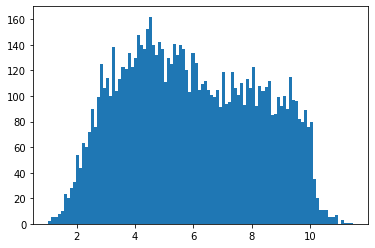

Embedding correlations:


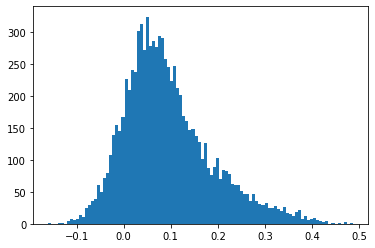

Gkm embedding correlations:


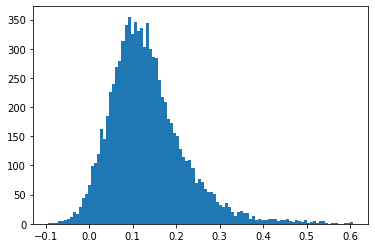

In [45]:
from matplotlib import pyplot as plt

print("ICs:")
plt.hist(premotif_ics, bins=100)
print(np.mean(premotif_ics < 5))
plt.show()
print("Embedding correlations:")
plt.hist(correlations, bins=100)
plt.show()
print("Gkm embedding correlations:")
plt.hist(gkm_correlations, bins=100)
plt.show()

#######################
FILTERING PERCENTILE: 0.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 1.030734121799469)
Coordinate:  example:179,start:502,end:543,rc:False
Contrib scores:


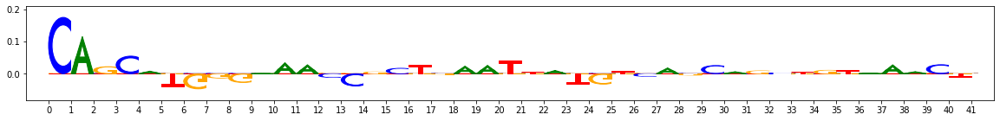

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.030734121799469


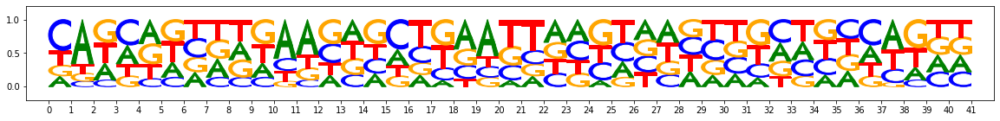

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 2.20218788087368


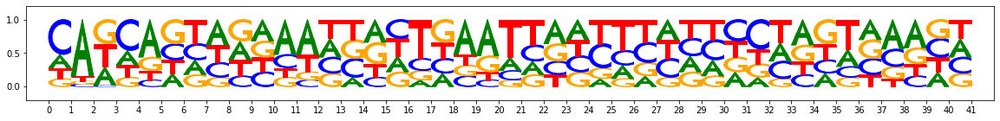

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.10160485)
Coordinate:  example:22,start:347,end:388,rc:False
Contrib scores:


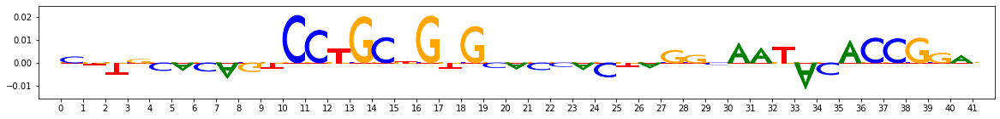

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.999975681304932


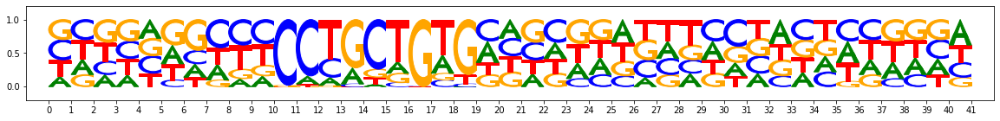

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 10.345165729522705


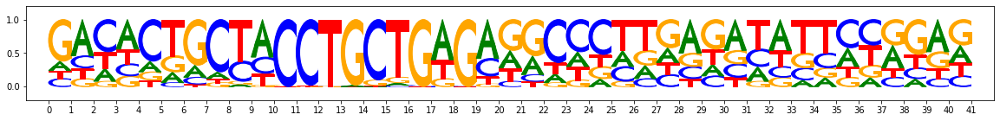

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.1597872538486656)
Coordinate:  example:971,start:401,end:442,rc:False
Contrib scores:


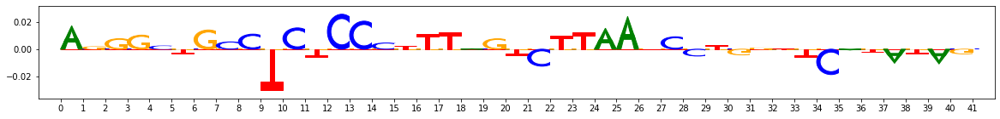

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.8922320306301117


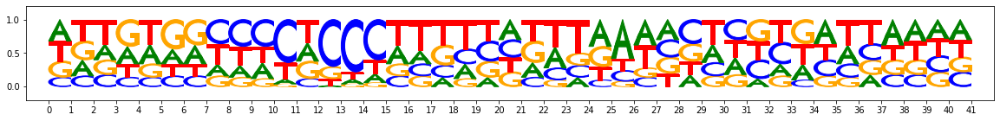

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.33773872256279


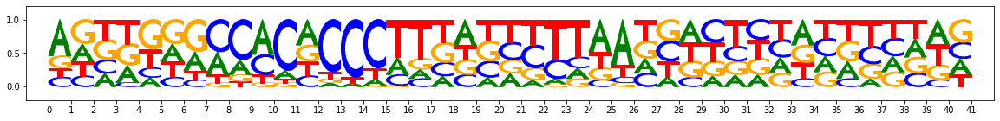

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: -0.09392008015840829)
Coordinate:  example:511,start:421,end:462,rc:False
Contrib scores:


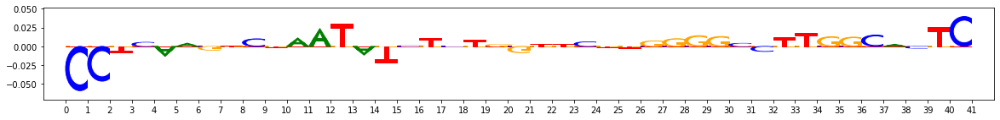

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.9685012102127075


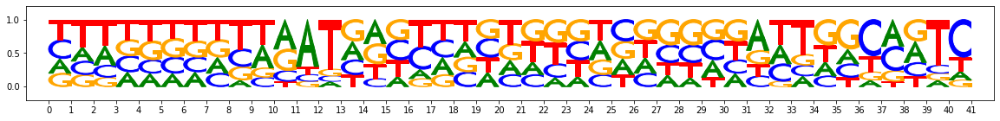

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.1975581347942352


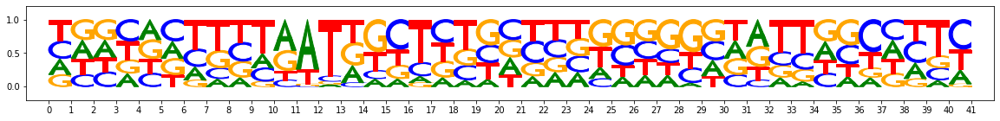

#######################
FILTERING PERCENTILE: 1.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 2.0480584800243378)
Coordinate:  example:843,start:423,end:464,rc:False
Contrib scores:


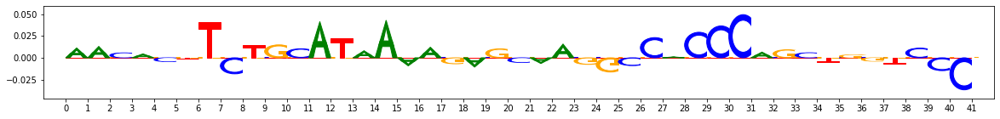

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.0480584800243378


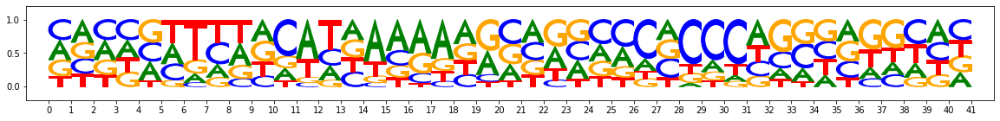

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 2.9034649580717087


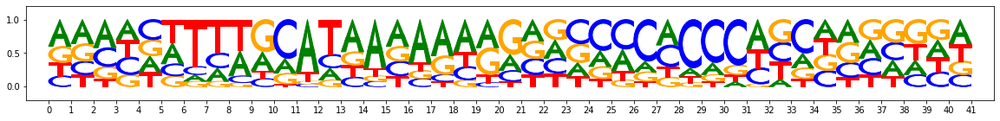

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.10498377)
Coordinate:  example:489,start:574,end:615,rc:False
Contrib scores:


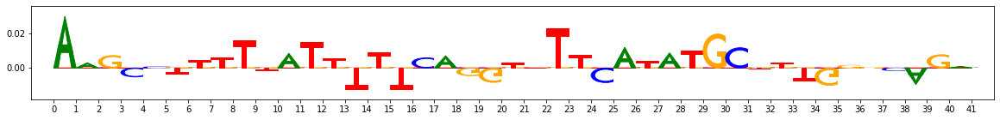

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.7174462117254734


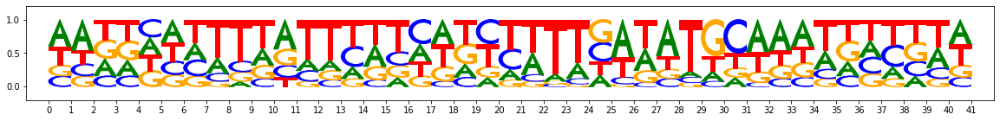

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.663561075925827


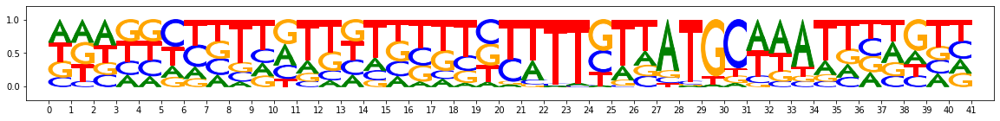

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.05695121311162537)
Coordinate:  example:355,start:384,end:425,rc:False
Contrib scores:


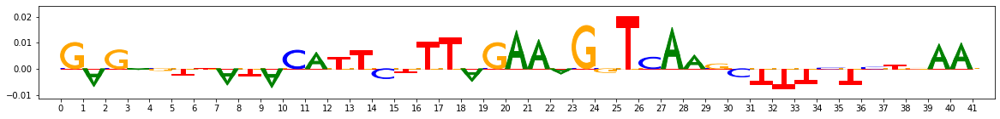

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.0472503006458282


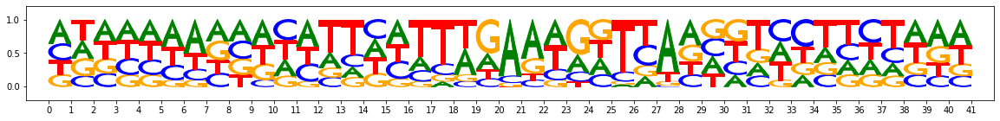

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.228433549404144


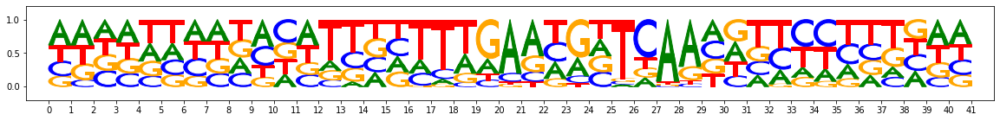

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: -0.006450747906577284)
Coordinate:  example:232,start:462,end:503,rc:False
Contrib scores:


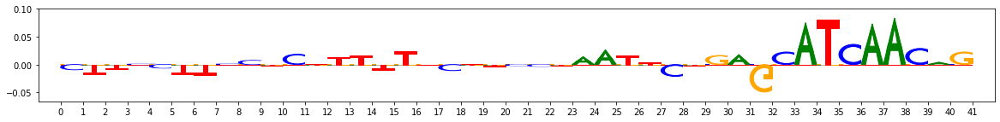

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.0881737768650055


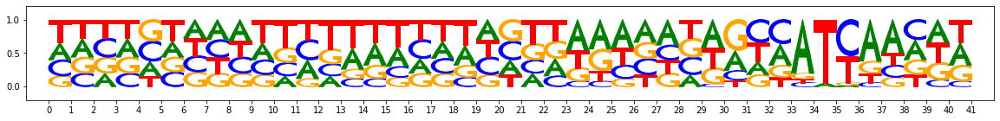

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.245169937610626


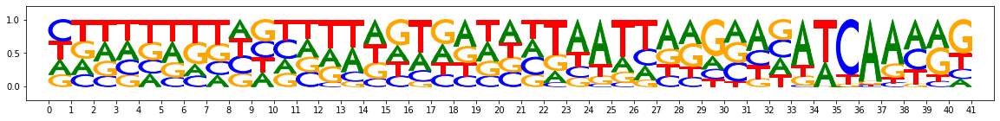

#######################
FILTERING PERCENTILE: 2.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 2.3790486454963684)
Coordinate:  example:1041,start:533,end:574,rc:False
Contrib scores:


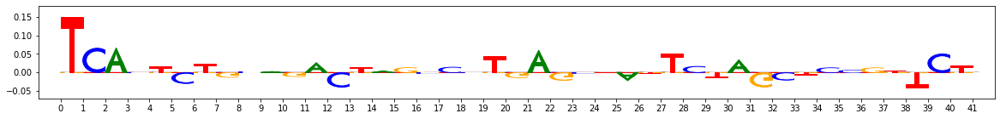

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.3790486454963684


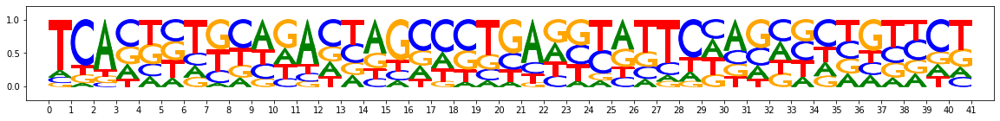

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.94742089509964


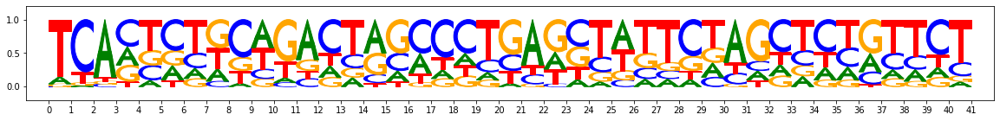

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.10830586)
Coordinate:  example:892,start:618,end:659,rc:False
Contrib scores:


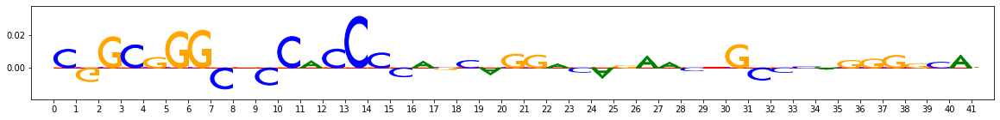

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.496167957782745


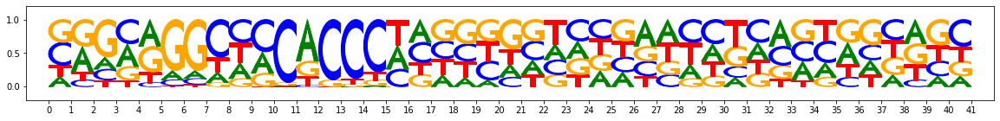

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.443643540143967


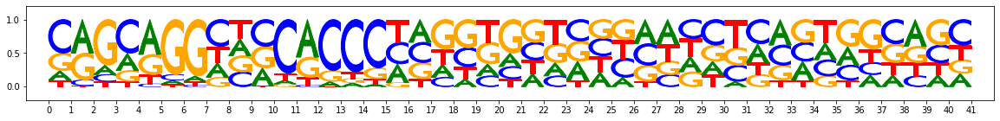

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.038318250708656534)
Coordinate:  example:483,start:406,end:447,rc:False
Contrib scores:


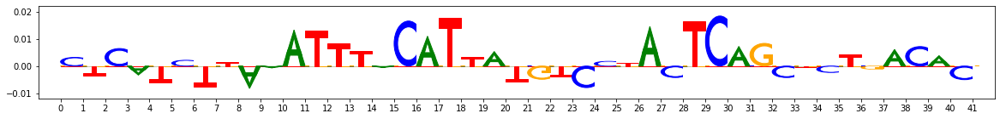

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.952633857727051


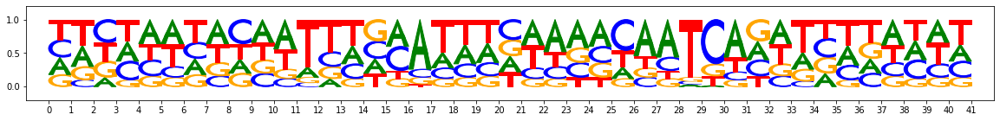

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.2018997967243195


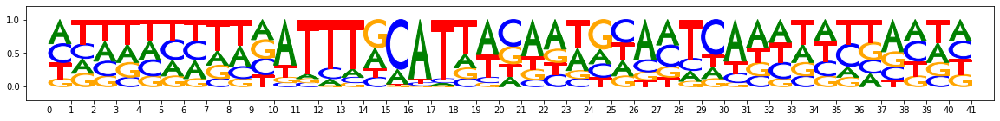

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.010375456258797147)
Coordinate:  example:897,start:446,end:487,rc:False
Contrib scores:


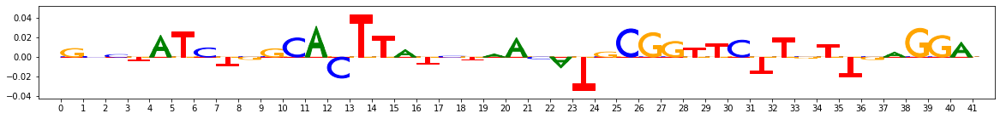

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.109874457120895


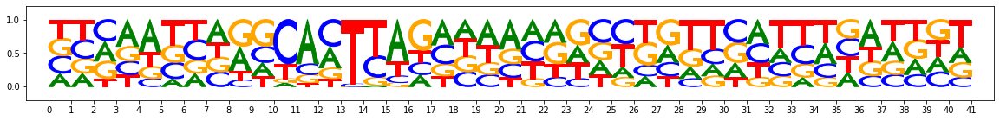

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.013668775558472


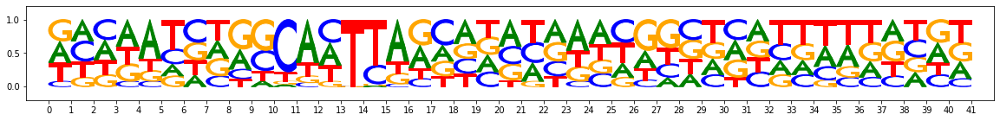

#######################
FILTERING PERCENTILE: 3.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 2.6064781323075294)
Coordinate:  example:322,start:423,end:464,rc:False
Contrib scores:


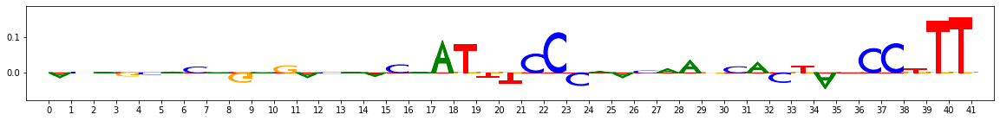

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.6064781323075294


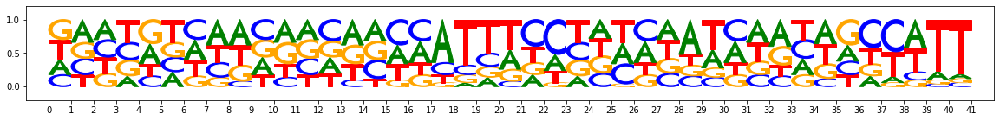

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.082119435071945


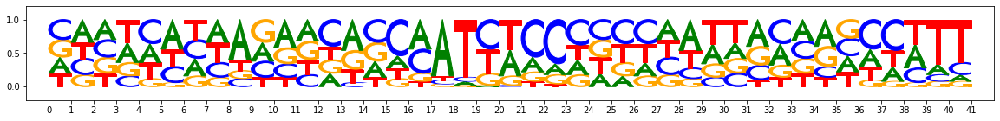

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.1120989)
Coordinate:  example:1046,start:566,end:607,rc:False
Contrib scores:


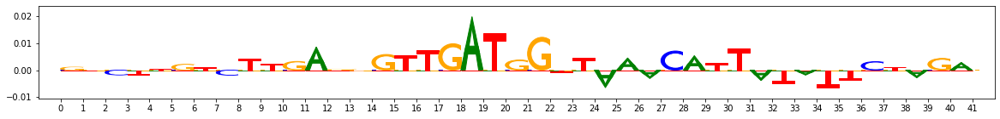

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.211128890514374


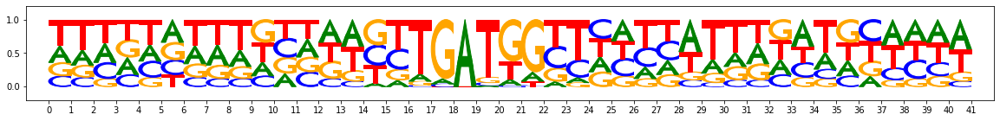

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.819315075874329


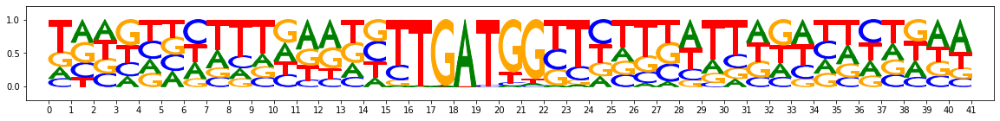

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.02583219588694769)
Coordinate:  example:500,start:563,end:604,rc:False
Contrib scores:


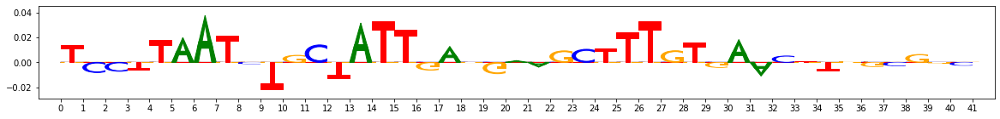

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.6609609127044678


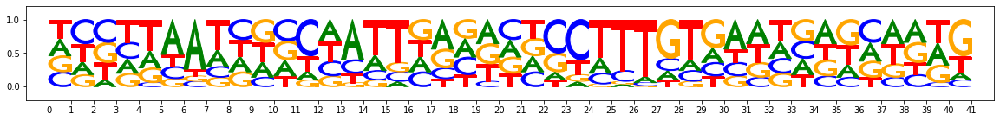

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.650756776332855


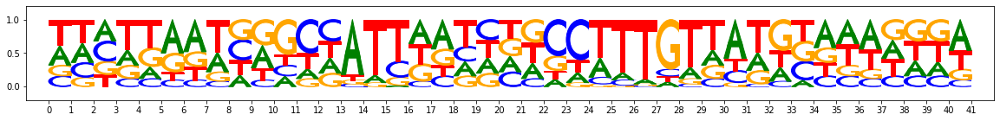

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.021318749464865085)
Coordinate:  example:971,start:598,end:639,rc:False
Contrib scores:


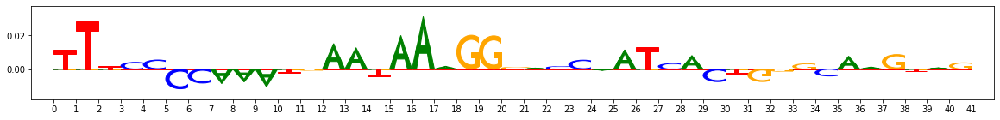

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.635990142822266


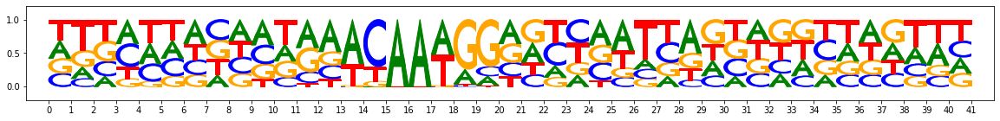

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.217581033706665


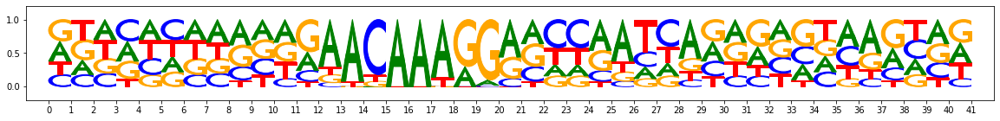

#######################
FILTERING PERCENTILE: 4.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 2.811682641506195)
Coordinate:  example:681,start:346,end:387,rc:False
Contrib scores:


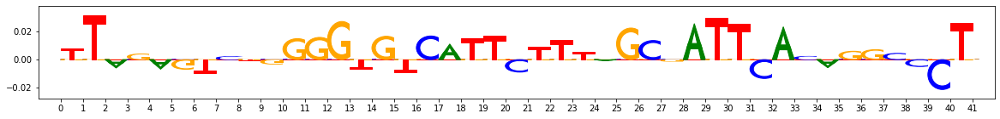

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.811682641506195


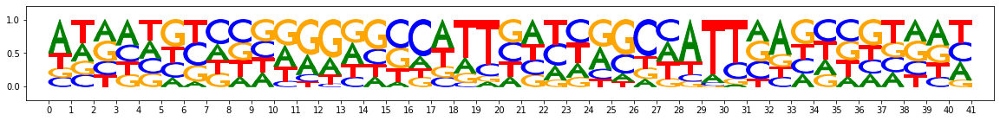

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 2.914280444383621


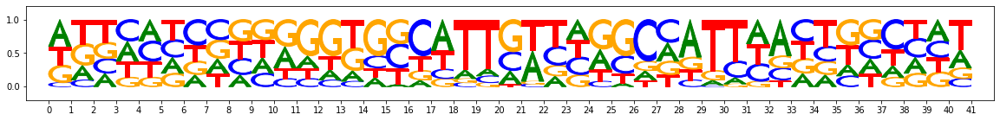

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.11580309)
Coordinate:  example:976,start:414,end:455,rc:False
Contrib scores:


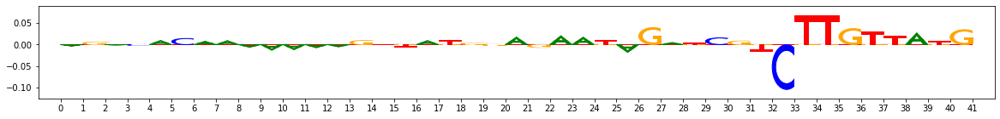

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.507766246795654


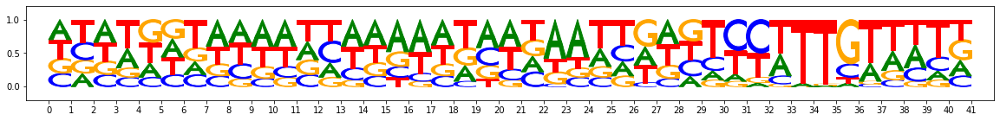

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.25559663772583


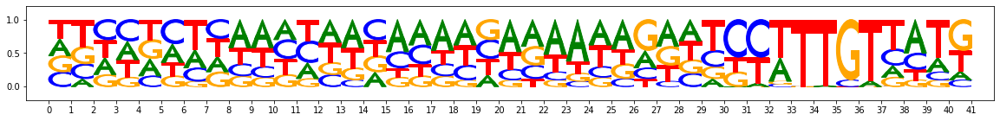

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.017079325054686723)
Coordinate:  example:472,start:568,end:609,rc:False
Contrib scores:


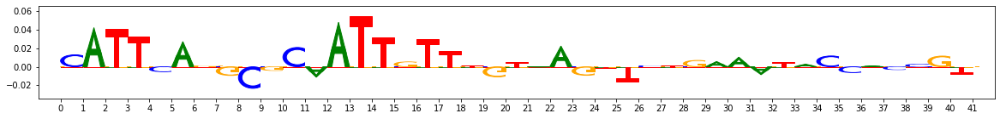

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.128971099853516


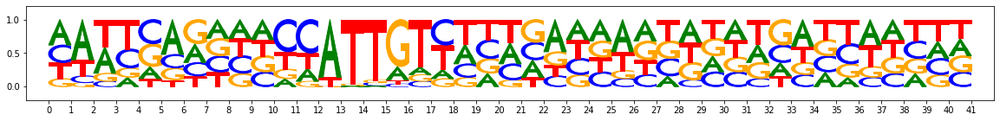

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.546304285526276


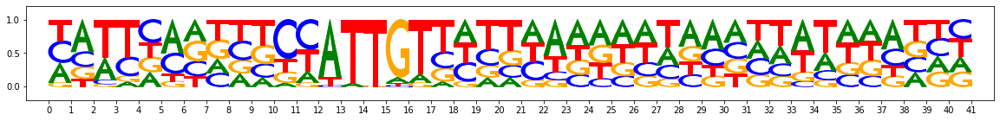

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.029859628071179437)
Coordinate:  example:344,start:437,end:478,rc:False
Contrib scores:


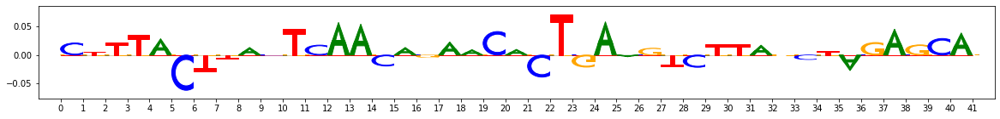

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.6274917274713516


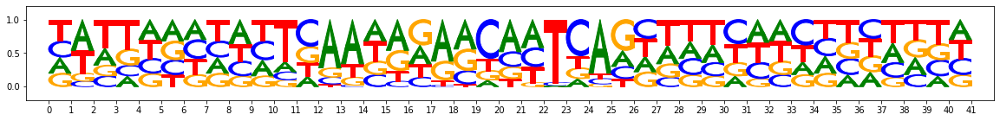

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.472877532243729


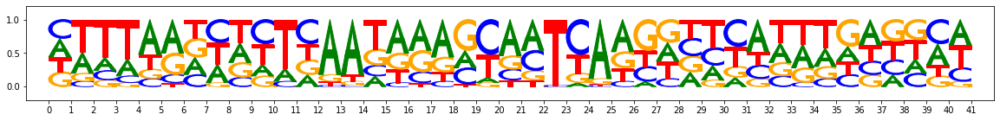

#######################
FILTERING PERCENTILE: 5.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 2.965553194284439)
Coordinate:  example:1044,start:570,end:611,rc:False
Contrib scores:


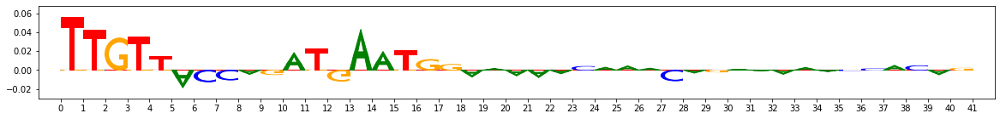

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.965553194284439


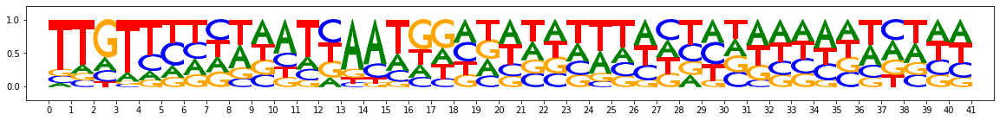

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.659452803432941


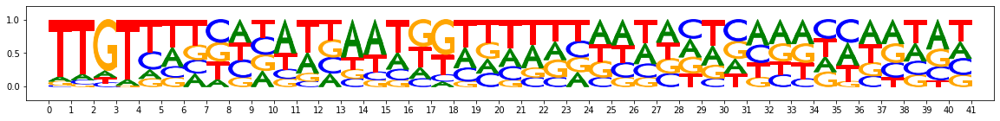

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.1196333)
Coordinate:  example:1066,start:541,end:582,rc:False
Contrib scores:


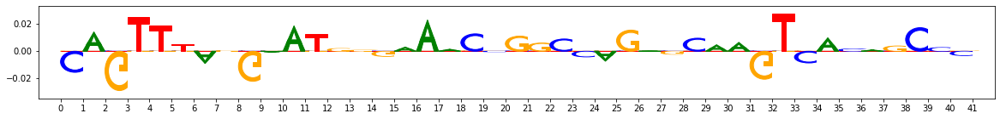

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.1721668094396591


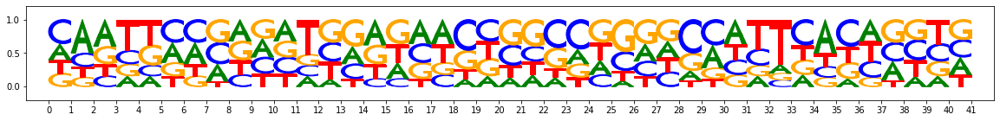

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 1.7599838078022003


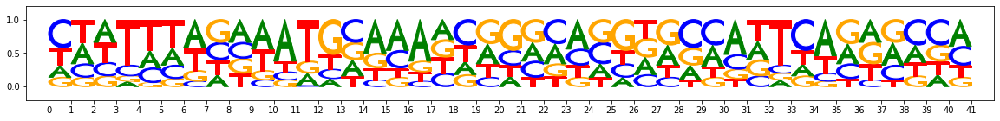

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.010032493022699457)
Coordinate:  example:923,start:403,end:444,rc:False
Contrib scores:


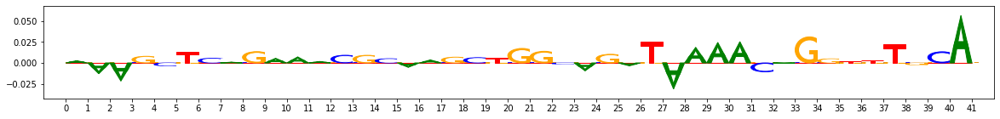

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.019363433122635


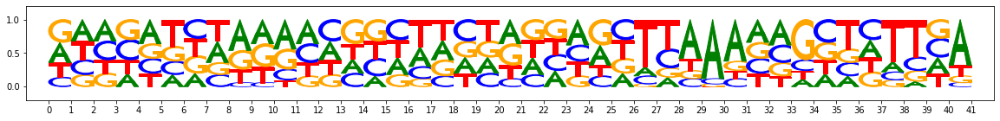

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.4833697974681854


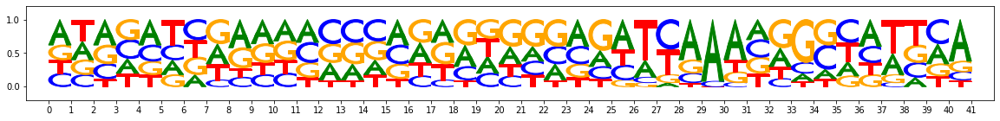

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.037452680296776966)
Coordinate:  example:363,start:440,end:481,rc:False
Contrib scores:


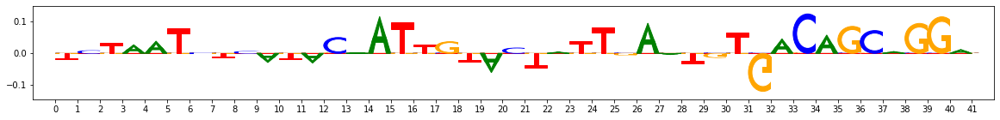

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.757713347673416


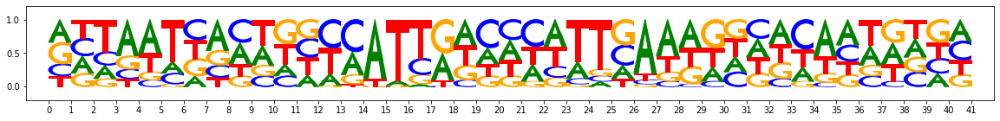

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.291304036974907


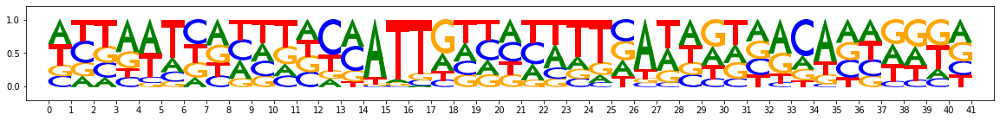

#######################
FILTERING PERCENTILE: 6.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.1254950426518917)
Coordinate:  example:687,start:424,end:465,rc:False
Contrib scores:


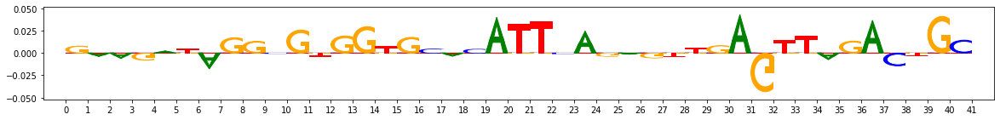

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.1254950426518917


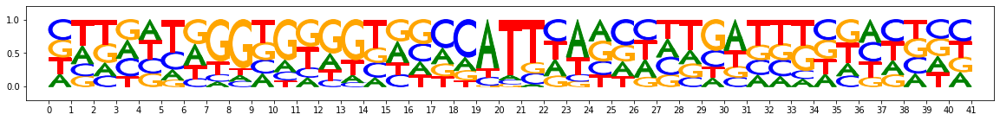

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.0531642735004425


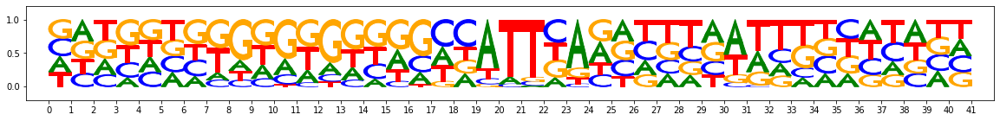

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.124489464)
Coordinate:  example:855,start:375,end:416,rc:False
Contrib scores:


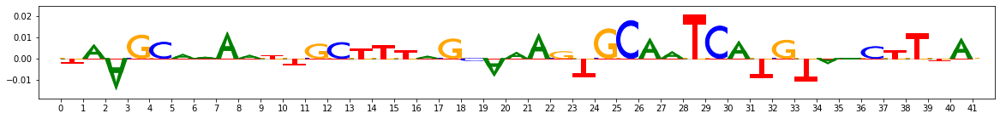

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.421762645244598


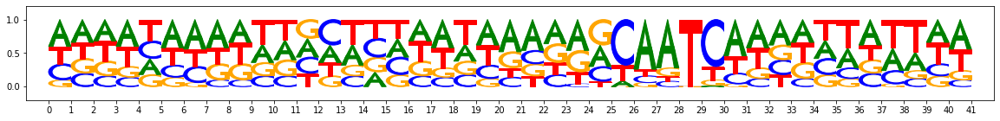

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.361906051635742


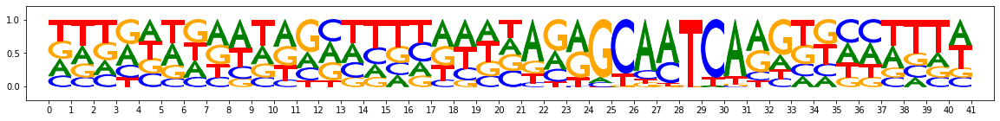

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: -0.002058448986696261)
Coordinate:  example:112,start:546,end:587,rc:False
Contrib scores:


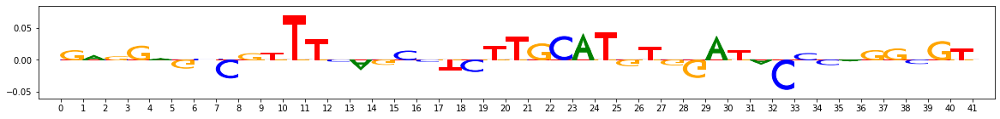

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.281904026865959


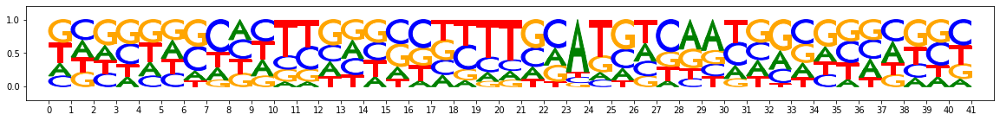

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.074420988559723


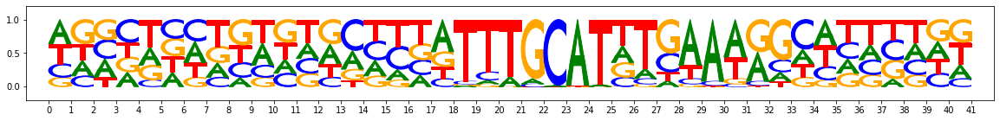

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.04482868525896415)
Coordinate:  example:237,start:742,end:783,rc:False
Contrib scores:


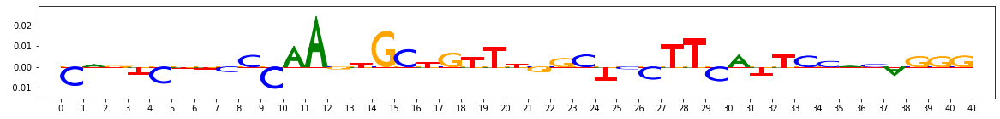

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.695793002843857


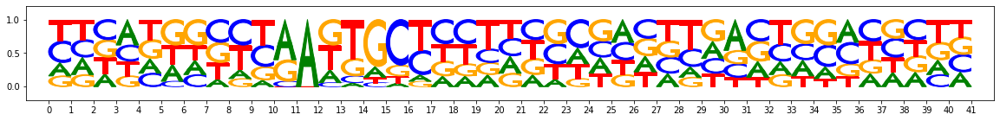

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.709360688924789


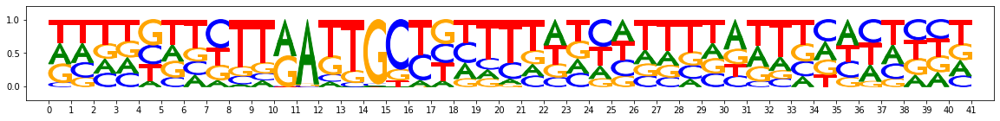

#######################
FILTERING PERCENTILE: 7.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.2905861735343933)
Coordinate:  example:365,start:479,end:520,rc:False
Contrib scores:


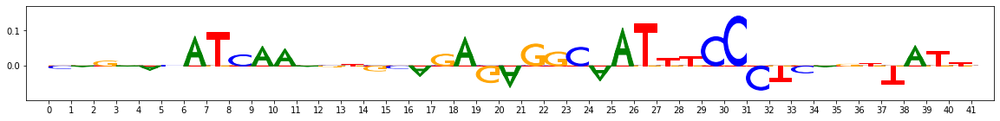

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.2905861735343933


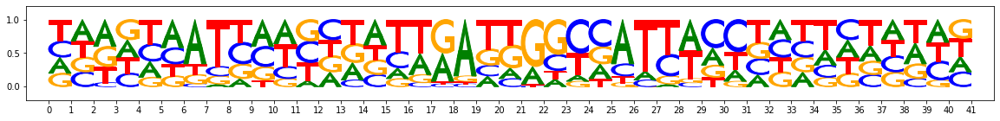

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.84362518787384


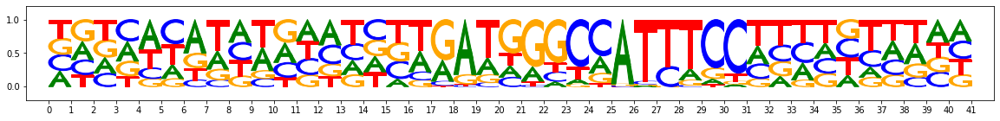

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.12874076)
Coordinate:  example:8,start:602,end:643,rc:False
Contrib scores:


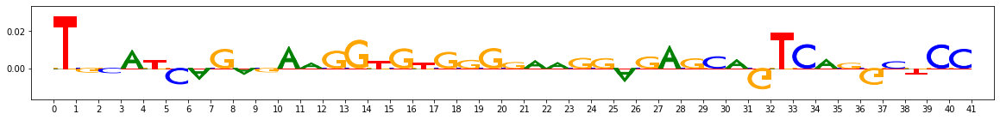

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.696627587080002


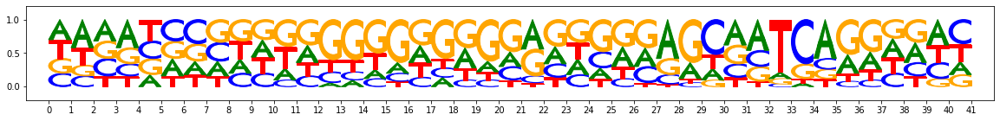

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.137817859649658


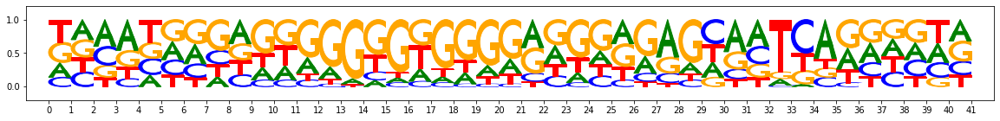

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.00372230854890897)
Coordinate:  example:203,start:390,end:431,rc:False
Contrib scores:


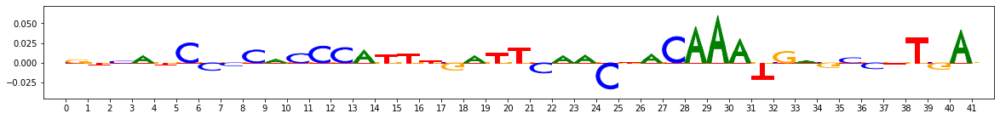

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.744063973426819


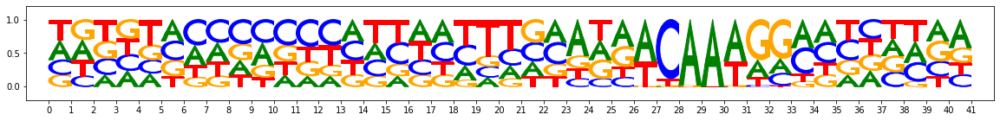

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.229486227035522


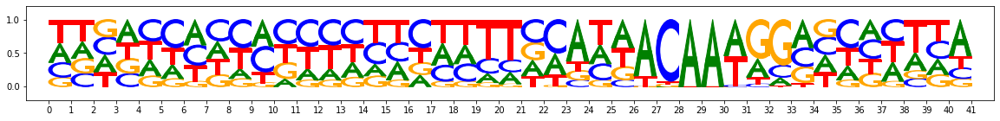

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.05030550850490255)
Coordinate:  example:662,start:543,end:584,rc:False
Contrib scores:


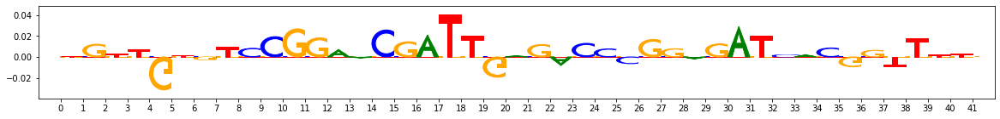

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.257418751716614


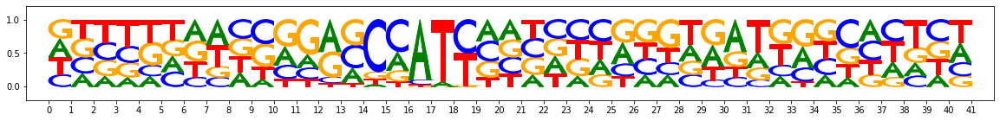

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.628850743174553


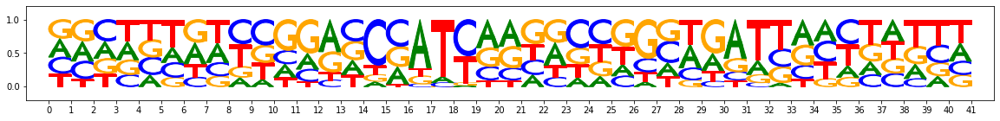

#######################
FILTERING PERCENTILE: 8.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.4420795142650604)
Coordinate:  example:581,start:384,end:425,rc:False
Contrib scores:


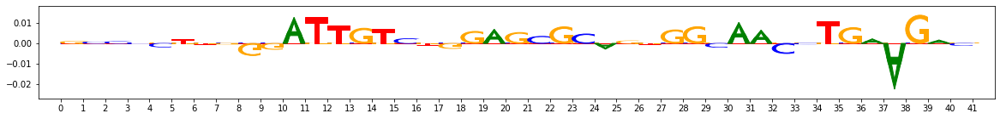

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.4420795142650604


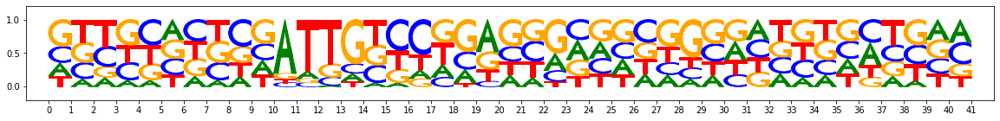

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.410344138741493


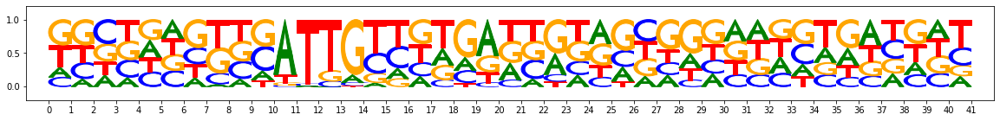

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.13358761)
Coordinate:  example:178,start:336,end:377,rc:False
Contrib scores:


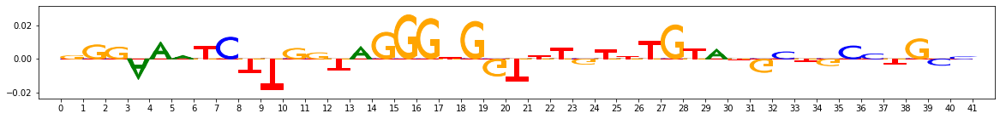

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.069516450166702


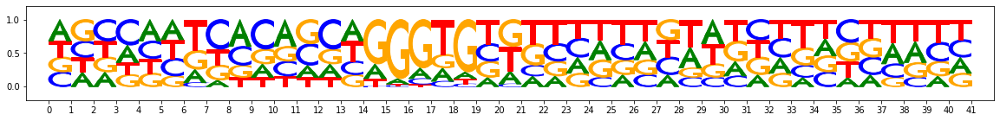

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.487959861755371


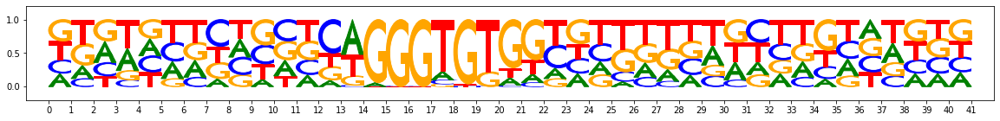

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.008909130372361124)
Coordinate:  example:708,start:529,end:570,rc:False
Contrib scores:


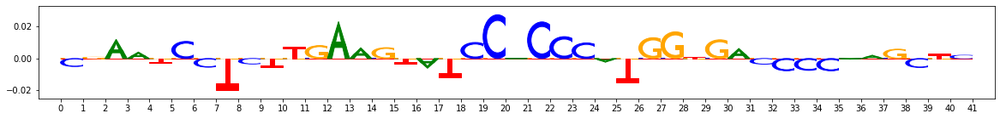

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.371335864067078


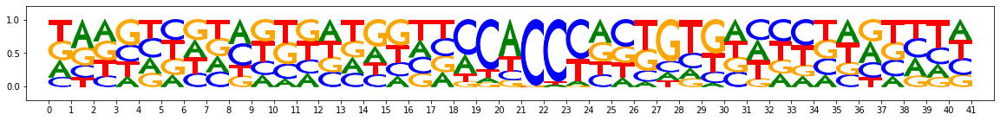

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.280980587005615


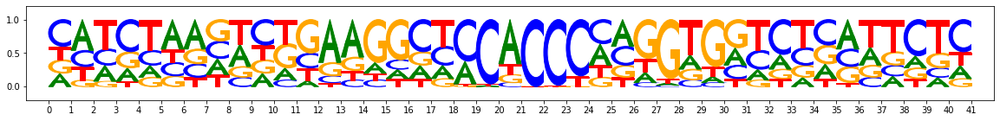

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.05545988633394297)
Coordinate:  example:127,start:617,end:658,rc:False
Contrib scores:


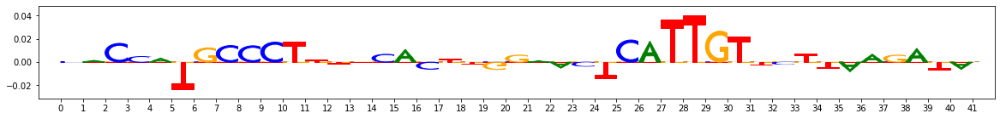

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.490138292312622


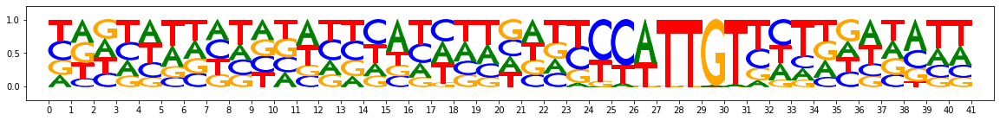

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.979891180992126


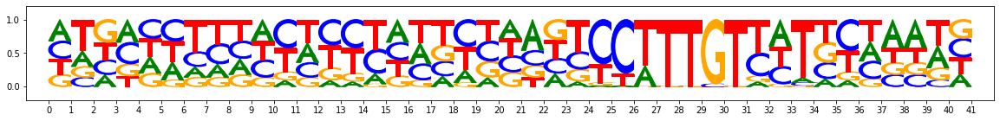

#######################
FILTERING PERCENTILE: 9.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.6106636226177216)
Coordinate:  example:848,start:511,end:552,rc:False
Contrib scores:


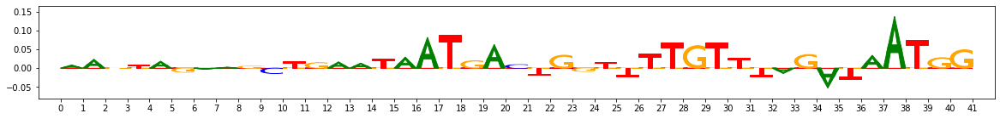

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.6106636226177216


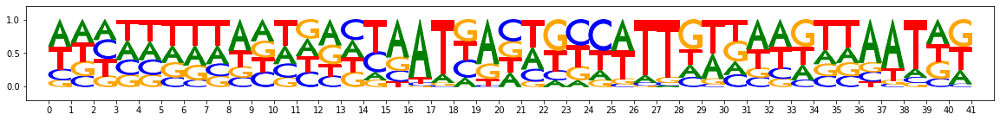

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.3059734404087067


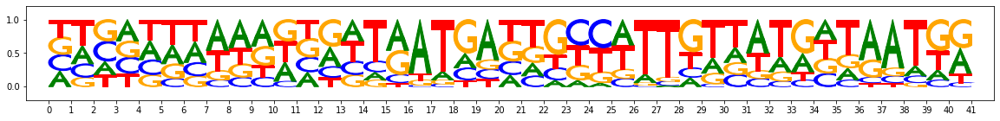

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.13868281)
Coordinate:  example:808,start:441,end:482,rc:False
Contrib scores:


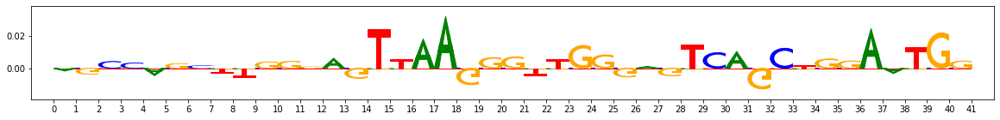

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.200835198163986


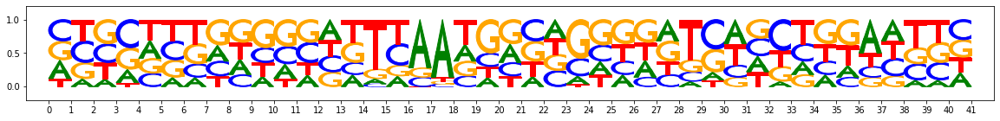

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.6457485258579254


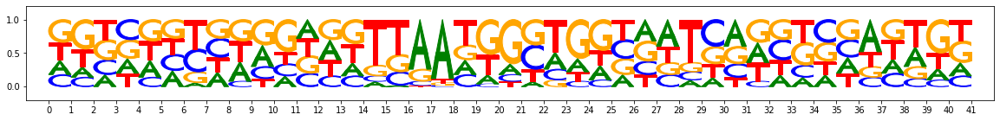

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.013913400954906186)
Coordinate:  example:262,start:394,end:435,rc:False
Contrib scores:


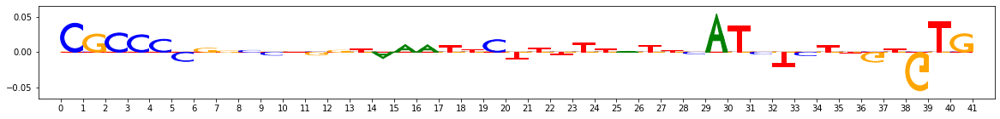

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.868824779987335


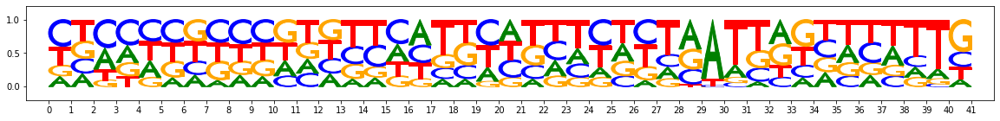

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.238439679145813


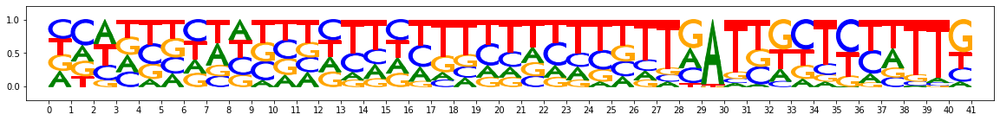

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.060547367416561304)
Coordinate:  example:236,start:502,end:543,rc:False
Contrib scores:


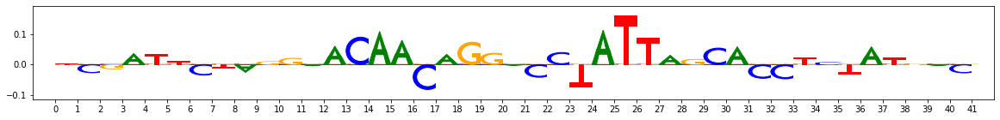

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.594528257846832


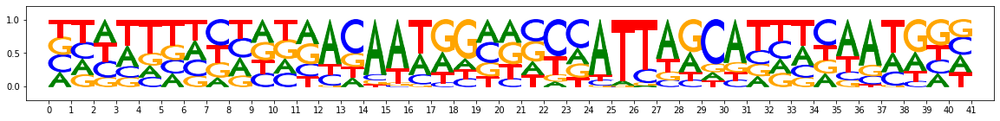

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.357405096292496


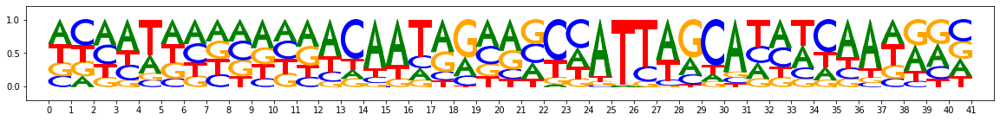

#######################
FILTERING PERCENTILE: 10.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.7521315068006516)
Coordinate:  example:754,start:475,end:516,rc:False
Contrib scores:


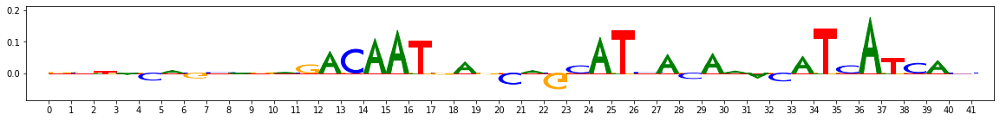

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.7521315068006516


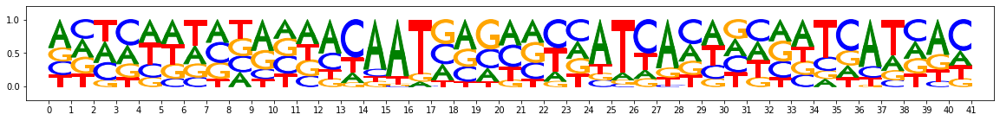

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.64250972867012


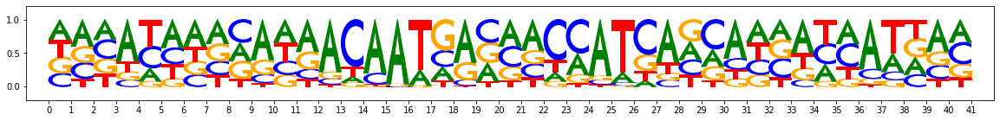

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.14405629)
Coordinate:  example:192,start:277,end:318,rc:False
Contrib scores:


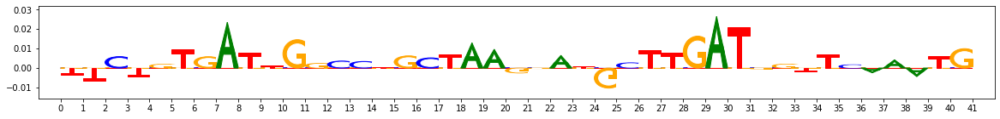

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.584400951862335


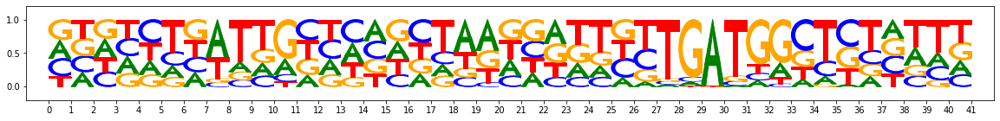

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.036849498748779


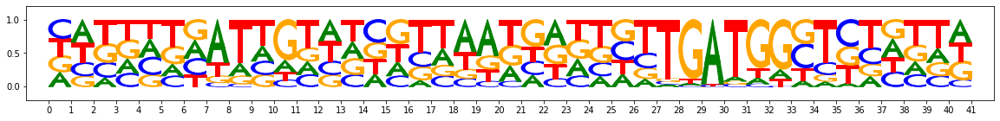

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.018885465483130914)
Coordinate:  example:389,start:376,end:417,rc:False
Contrib scores:


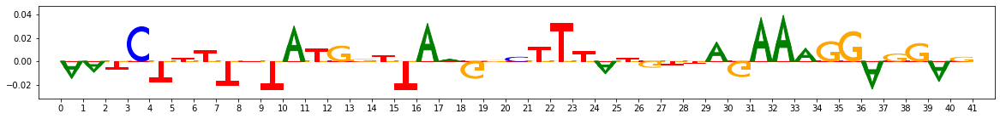

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.753226101398468


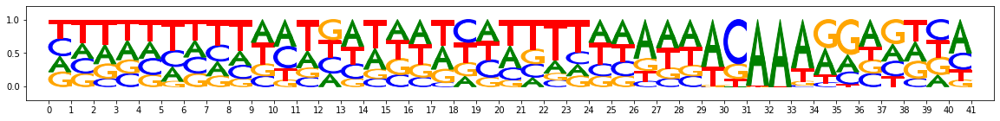

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.135436177253723


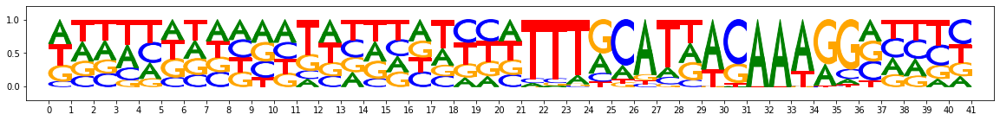

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.06506753823031229)
Coordinate:  example:599,start:426,end:467,rc:False
Contrib scores:


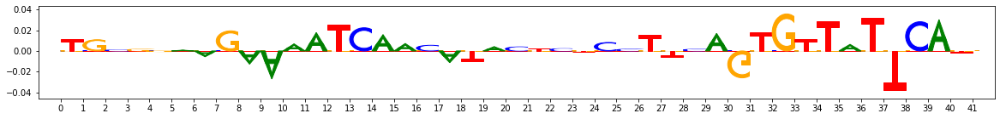

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.91553595662117


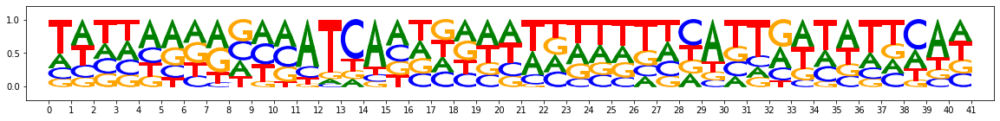

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 2.7723824977874756


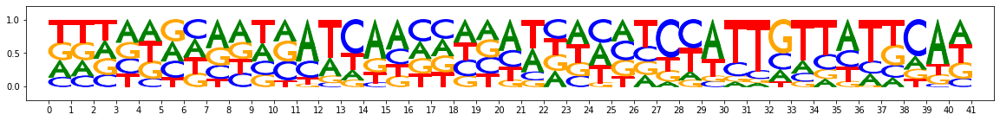

#######################
FILTERING PERCENTILE: 11.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 3.887529134750366)
Coordinate:  example:394,start:658,end:699,rc:False
Contrib scores:


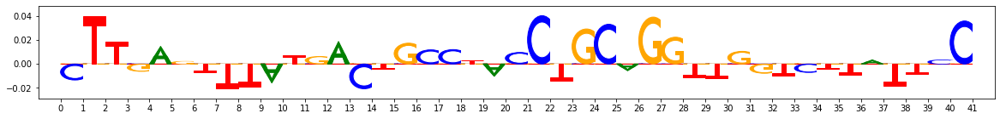

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.887529134750366


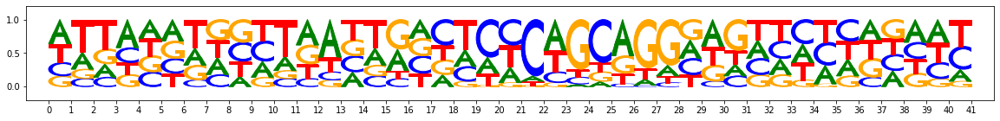

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.52202033996582


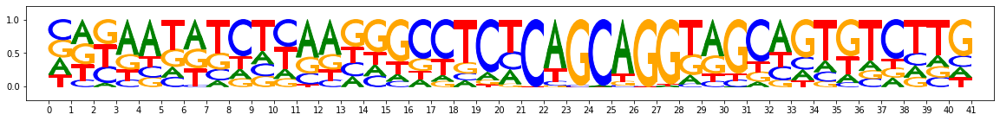

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.14924939)
Coordinate:  example:283,start:340,end:381,rc:False
Contrib scores:


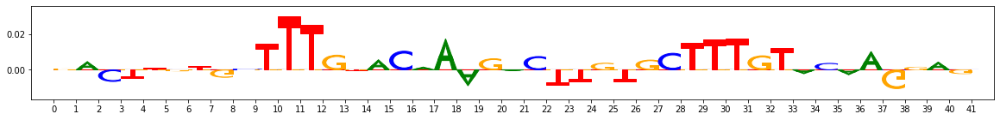

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.8928510546684265


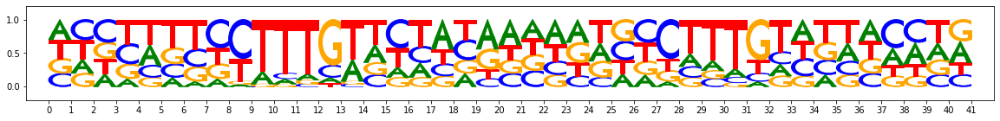

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.29382586479187


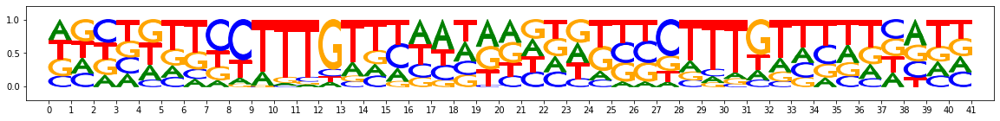

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.023810817749878012)
Coordinate:  example:530,start:483,end:524,rc:False
Contrib scores:


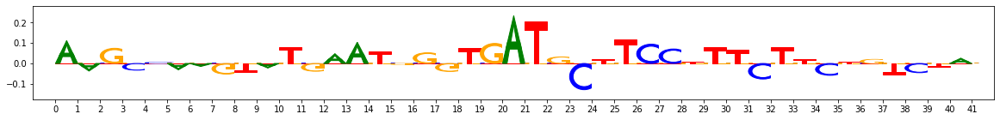

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.011265456676483


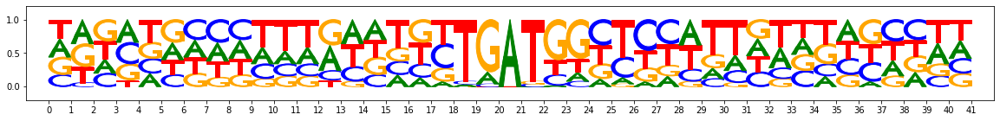

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.440124154090881


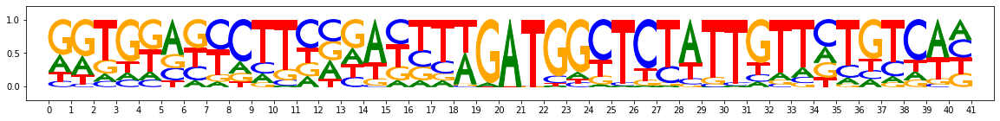

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.0694423281590364)
Coordinate:  example:723,start:594,end:635,rc:False
Contrib scores:


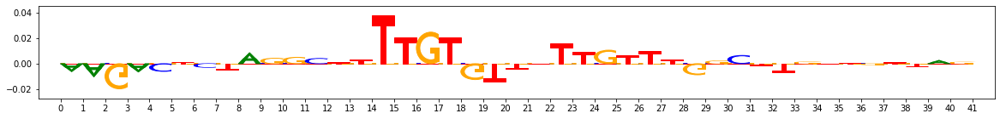

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.55102914571762


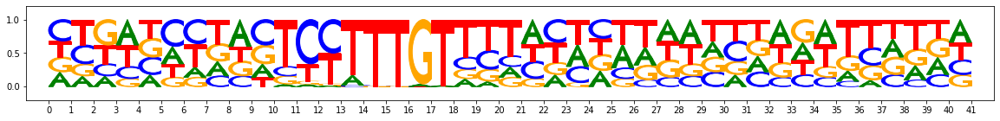

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.918137609958649


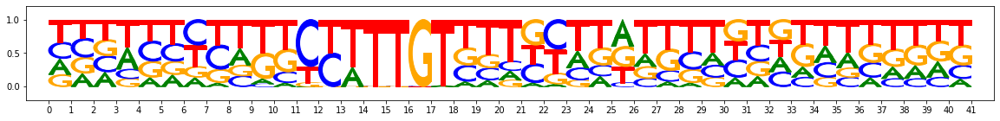

#######################
FILTERING PERCENTILE: 12.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.0268659591674805)
Coordinate:  example:963,start:423,end:464,rc:False
Contrib scores:


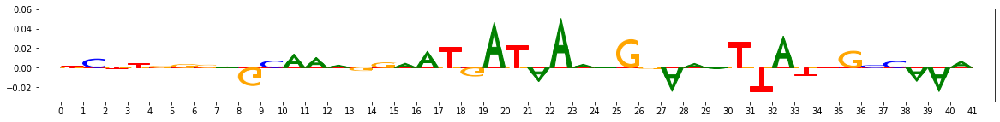

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.0268659591674805


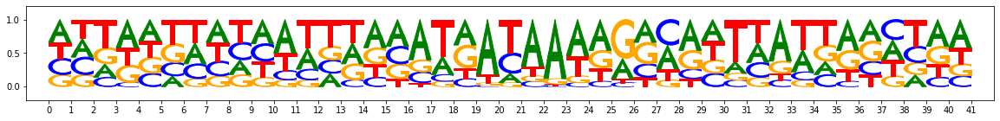

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.050699919462204


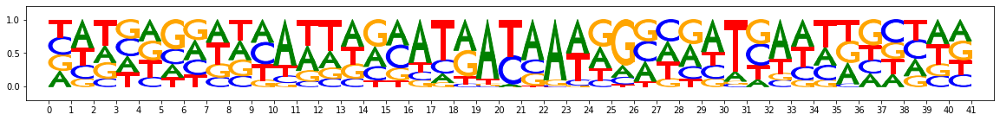

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.15513128)
Coordinate:  example:241,start:421,end:462,rc:False
Contrib scores:


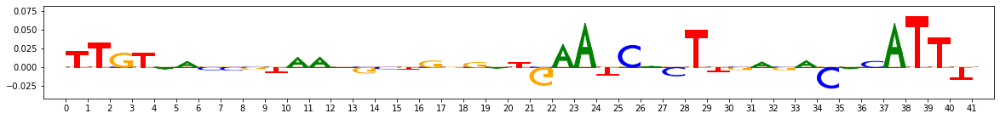

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.0530441850423813


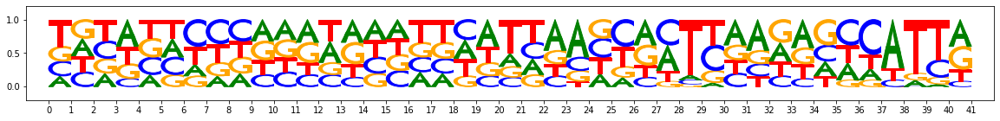

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.340800642967224


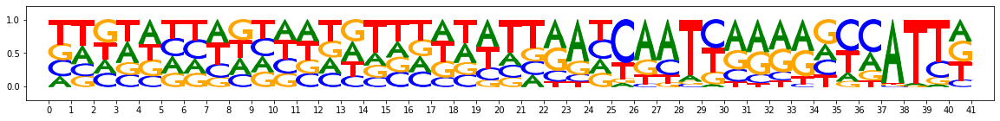

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.027965838584146734)
Coordinate:  example:450,start:457,end:498,rc:False
Contrib scores:


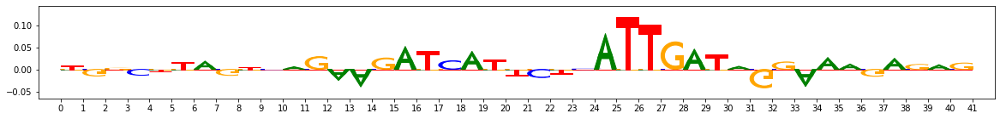

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.863122642040253


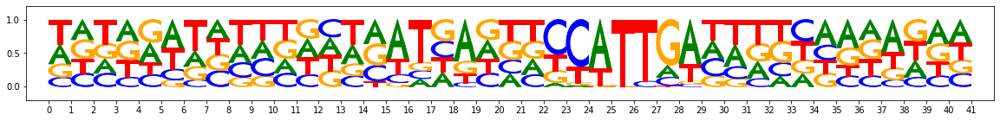

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.765991449356079


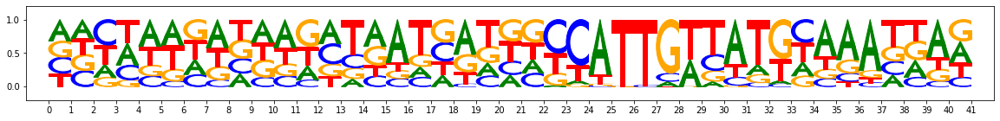

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.07383524584297542)
Coordinate:  example:866,start:452,end:493,rc:False
Contrib scores:


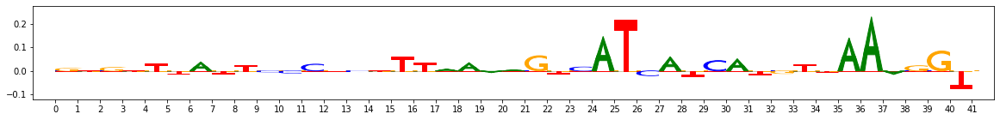

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.158167362213135


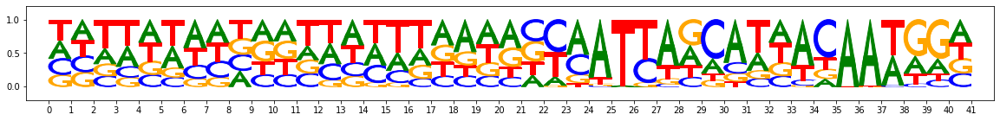

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.991694048047066


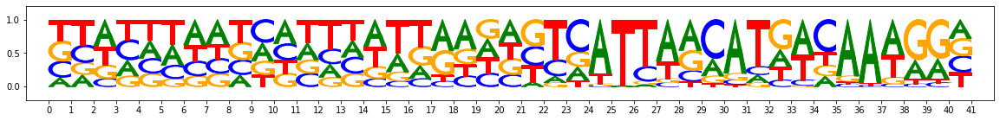

#######################
FILTERING PERCENTILE: 13.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.155803561210632)
Coordinate:  example:73,start:442,end:483,rc:False
Contrib scores:


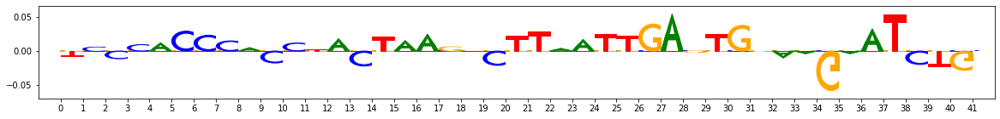

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.155803561210632


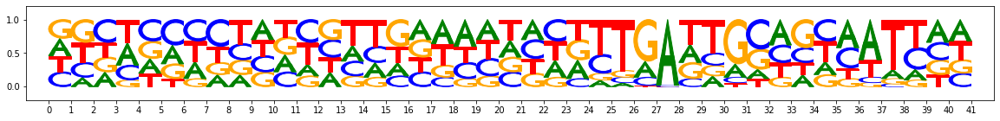

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.924408823251724


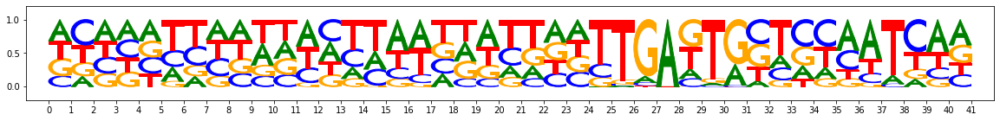

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.16143382)
Coordinate:  example:50,start:539,end:580,rc:False
Contrib scores:


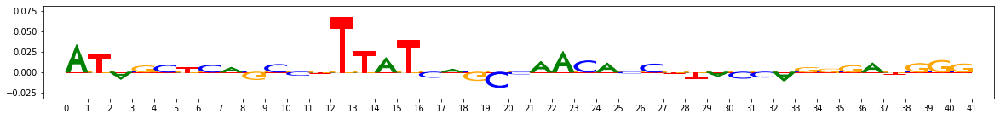

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.5951539278030396


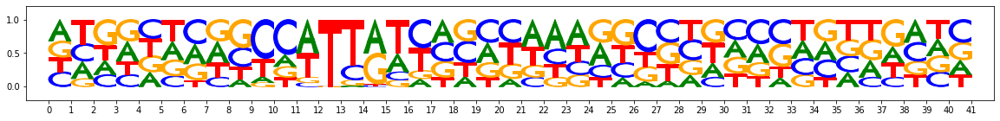

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.416216880083084


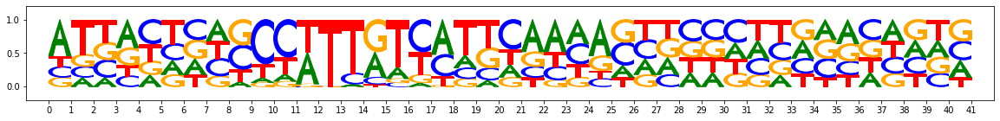

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.03200496524130704)
Coordinate:  example:733,start:492,end:533,rc:False
Contrib scores:


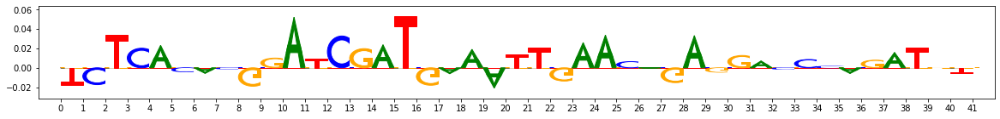

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.3750777542591095


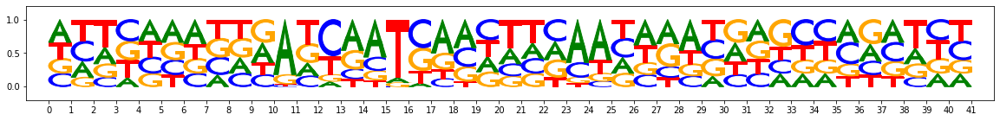

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.411634862422943


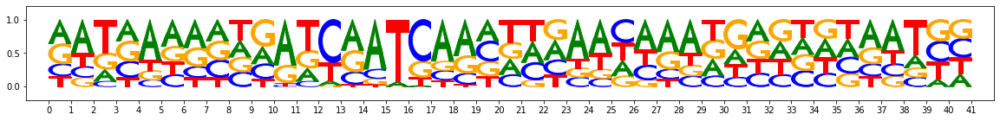

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.07781186630722618)
Coordinate:  example:628,start:388,end:429,rc:False
Contrib scores:


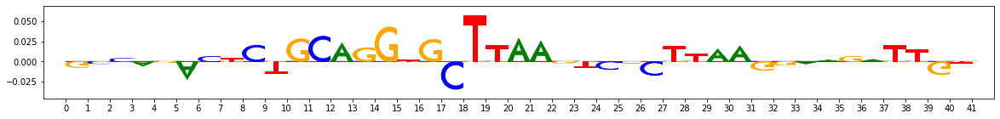

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.020858824253082


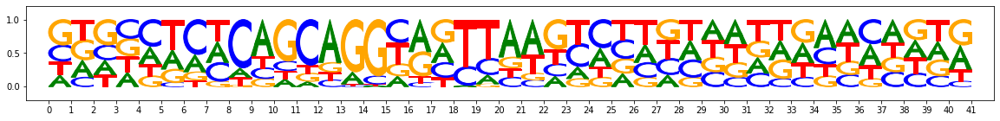

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.485421806573868


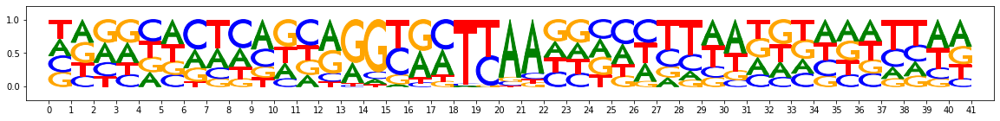

#######################
FILTERING PERCENTILE: 14.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.28480988740921)
Coordinate:  example:199,start:540,end:581,rc:False
Contrib scores:


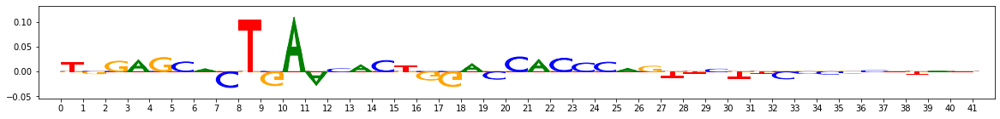

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.28480988740921


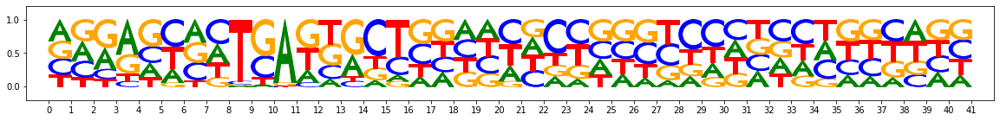

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.142393320798874


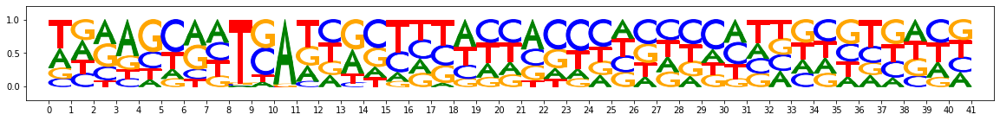

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.1674541)
Coordinate:  example:644,start:307,end:348,rc:False
Contrib scores:


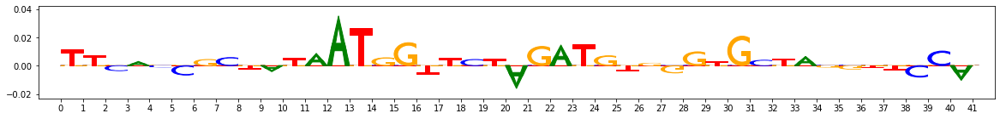

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.643384039402008


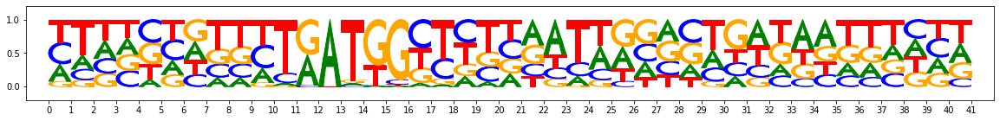

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.143579125404358


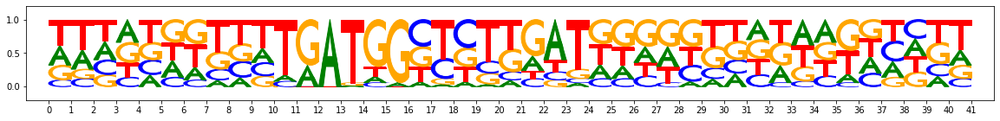

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.03550922483827886)
Coordinate:  example:744,start:560,end:601,rc:False
Contrib scores:


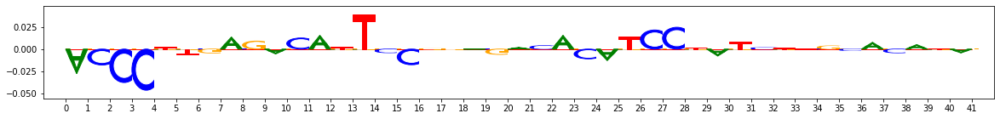

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.043456017971039


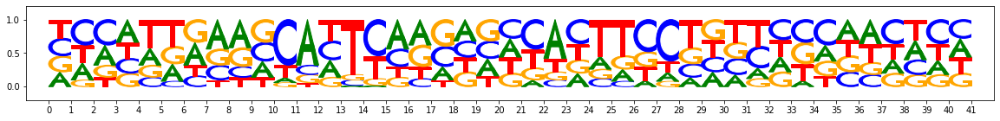

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.14938747882843


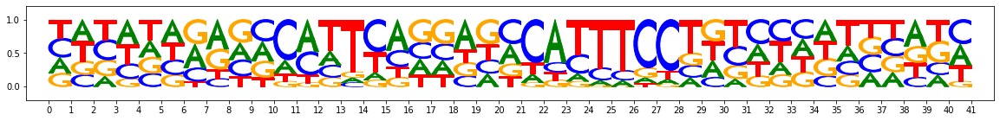

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.08155555025407353)
Coordinate:  example:98,start:429,end:470,rc:False
Contrib scores:


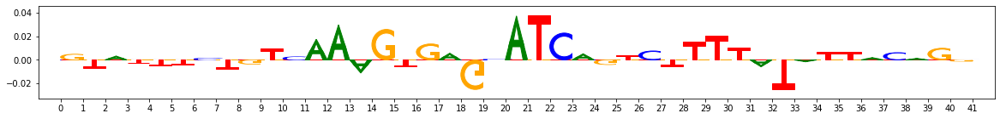

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.082629680633545


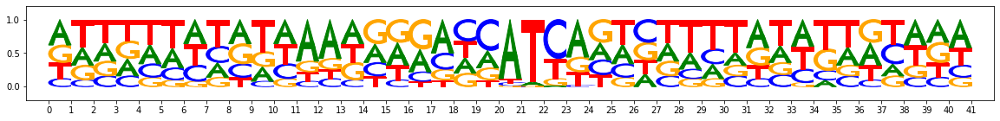

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.936190038919449


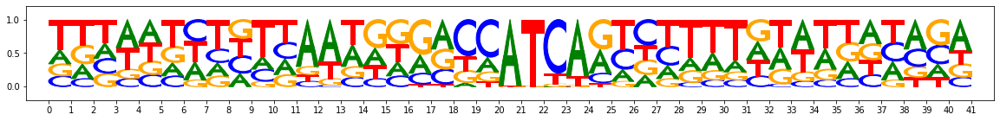

#######################
FILTERING PERCENTILE: 15.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.416711539030075)
Coordinate:  example:487,start:427,end:468,rc:False
Contrib scores:


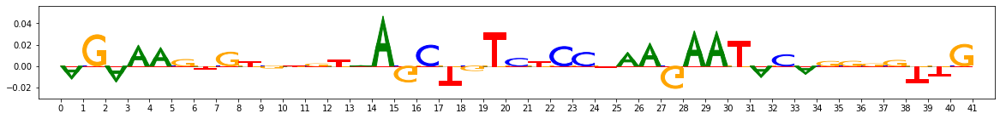

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.416711539030075


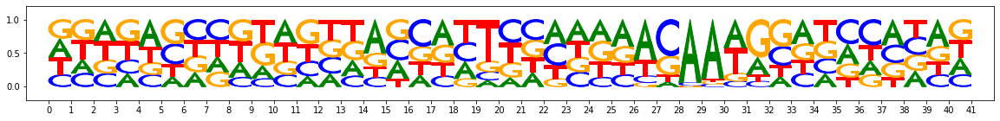

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.258185029029846


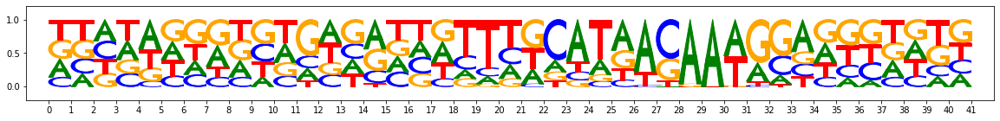

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.17412324)
Coordinate:  example:854,start:534,end:575,rc:False
Contrib scores:


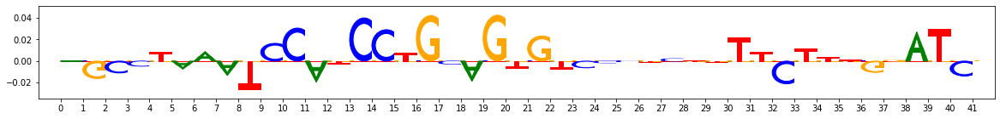

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.900218844413757


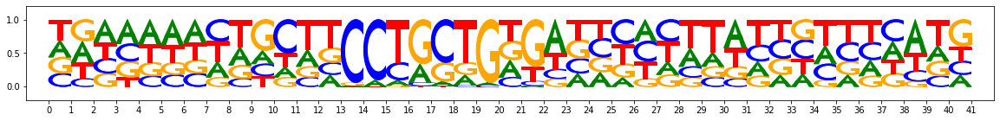

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.943876147270203


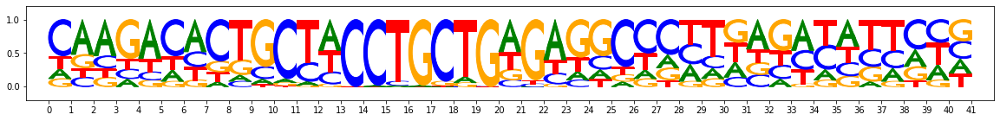

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.03895302807705844)
Coordinate:  example:949,start:643,end:684,rc:False
Contrib scores:


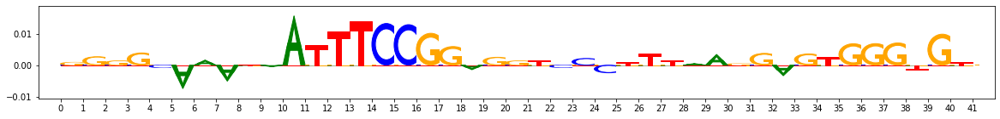

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.208838999271393


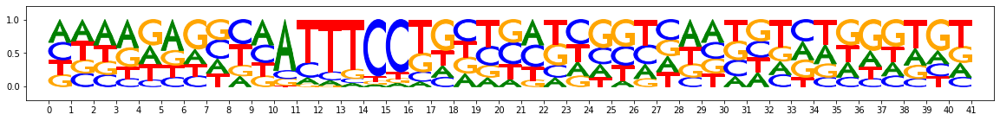

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.338847875595093


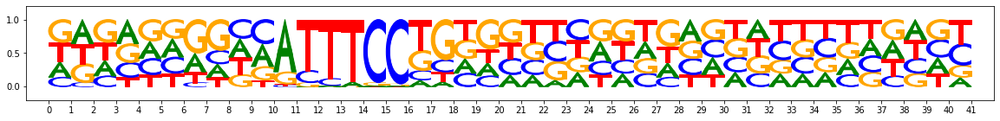

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.08536030727389843)
Coordinate:  example:344,start:498,end:539,rc:False
Contrib scores:


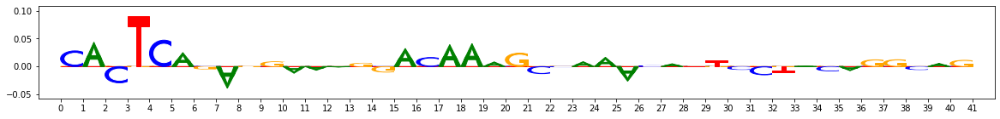

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.9588822722435


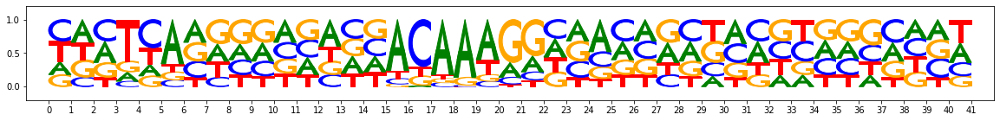

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.248651742935181


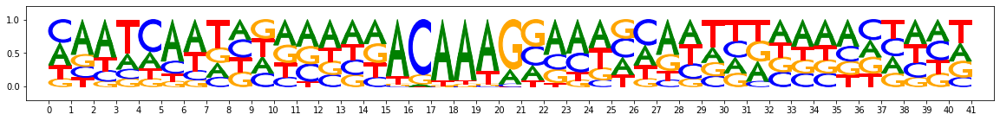

#######################
FILTERING PERCENTILE: 16.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.528893411159515)
Coordinate:  example:508,start:620,end:661,rc:False
Contrib scores:


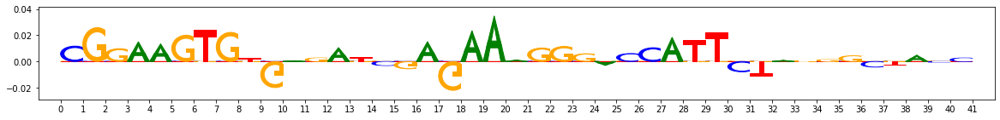

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.528893411159515


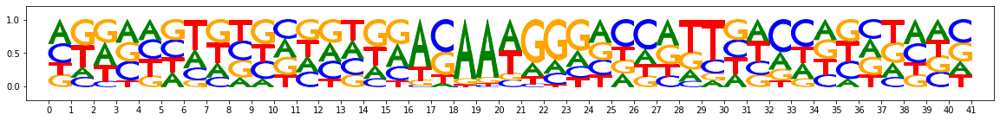

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.979274809360504


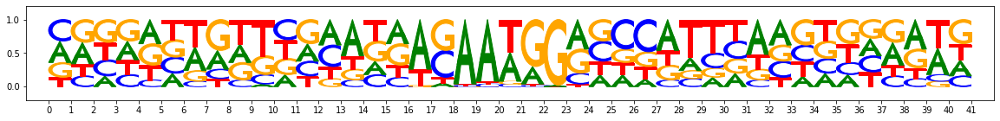

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.180812)
Coordinate:  example:798,start:531,end:572,rc:False
Contrib scores:


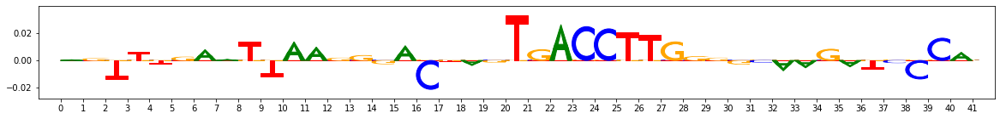

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 9.508095681667328


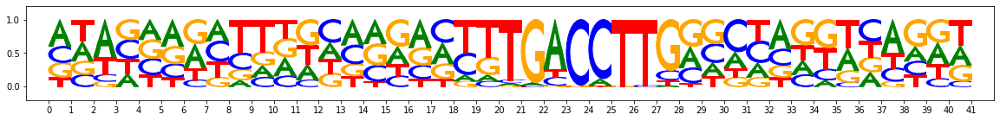

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.667443990707397


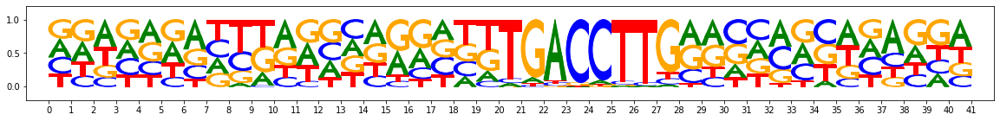

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.04271517624627662)
Coordinate:  example:659,start:548,end:589,rc:False
Contrib scores:


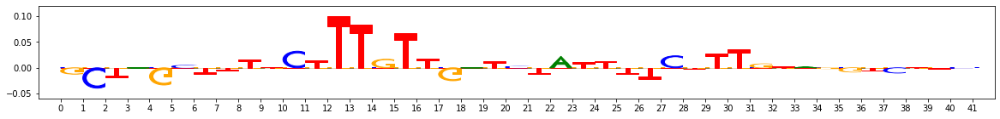

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 10.349379062652588


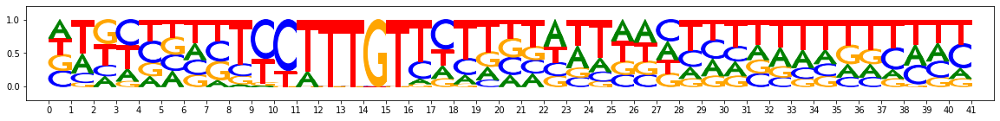

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 10.67693293094635


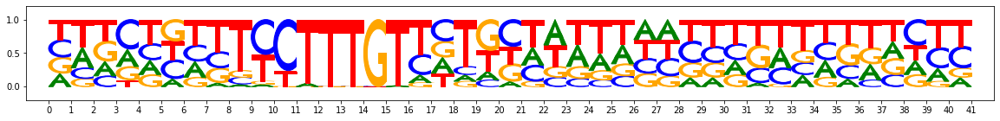

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.08867953336355179)
Coordinate:  example:512,start:439,end:480,rc:False
Contrib scores:


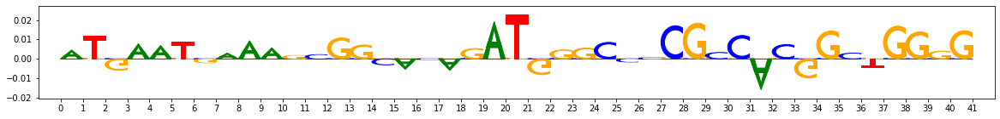

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 1.9320897161960602


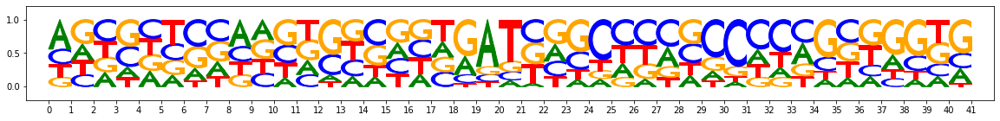

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 2.5282019078731537


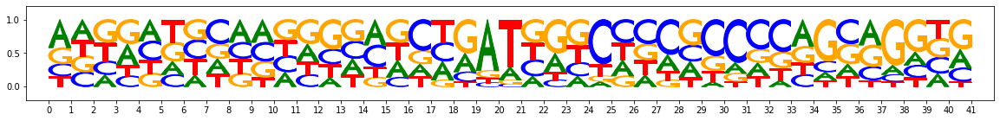

#######################
FILTERING PERCENTILE: 17.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.647804260253906)
Coordinate:  example:153,start:518,end:559,rc:False
Contrib scores:


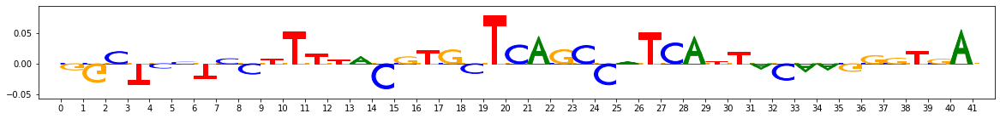

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.647804260253906


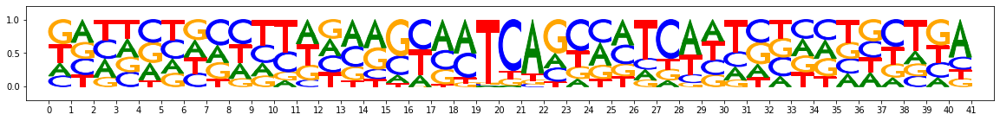

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.806222647428513


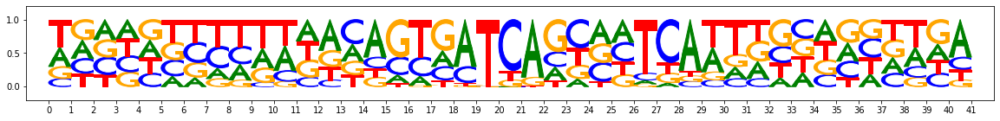

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.18736127)
Coordinate:  example:415,start:490,end:531,rc:False
Contrib scores:


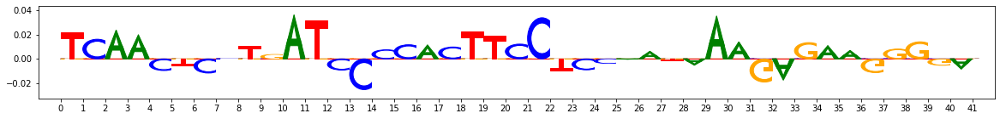

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 2.8462231419980526


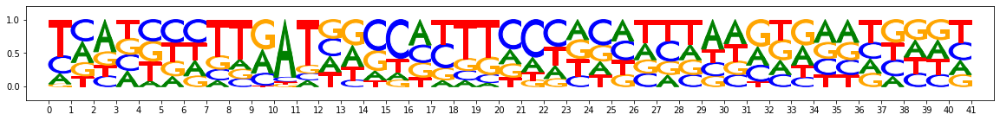

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 3.5502933263778687


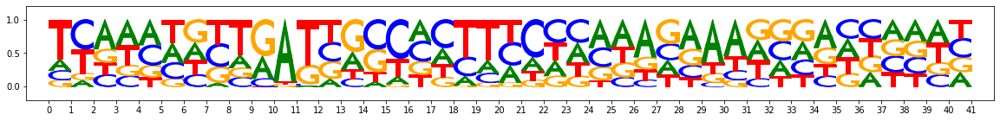

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.04706229425410183)
Coordinate:  example:1027,start:359,end:400,rc:False
Contrib scores:


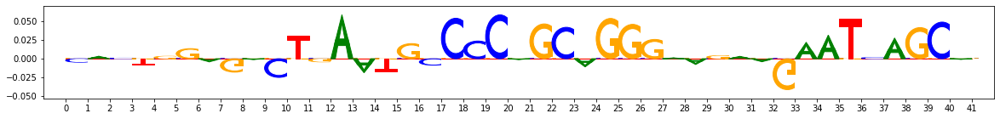

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 8.02101480960846


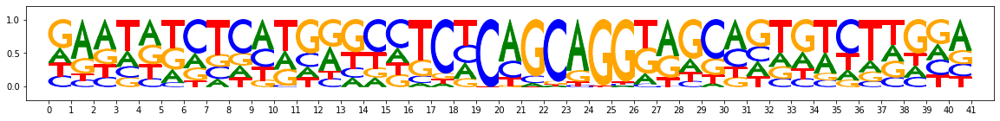

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 8.246418535709381


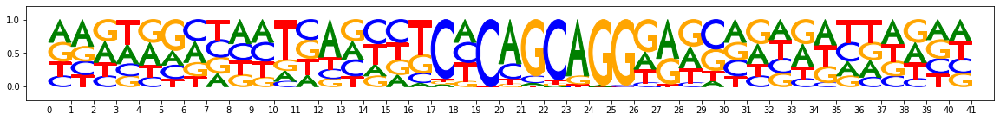

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.09219304816661499)
Coordinate:  example:152,start:336,end:377,rc:False
Contrib scores:


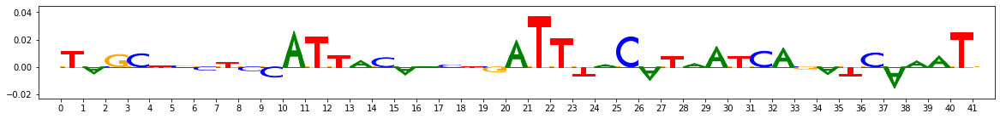

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 5.162377595901489


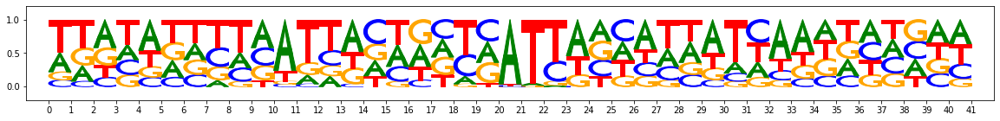

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 5.797918677330017


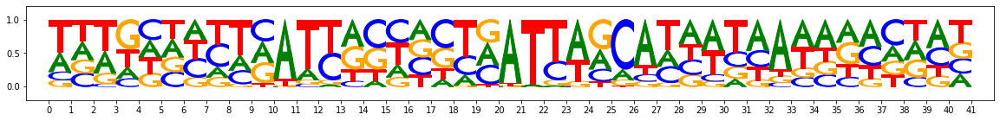

#######################
FILTERING PERCENTILE: 18.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.78784841299057)
Coordinate:  example:891,start:484,end:525,rc:False
Contrib scores:


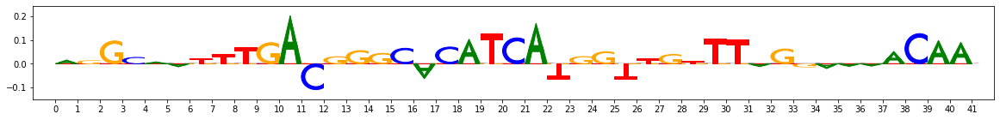

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.78784841299057


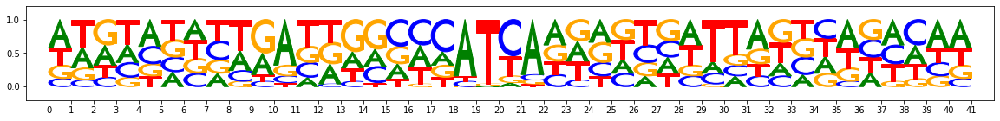

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.323245614767075


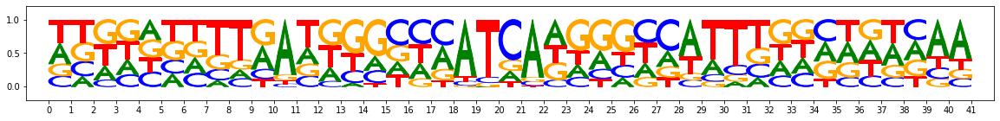

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.1951316)
Coordinate:  example:1048,start:482,end:523,rc:False
Contrib scores:


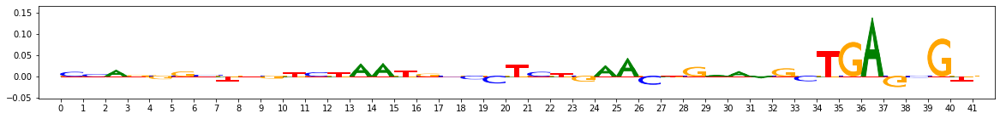

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.590397924184799


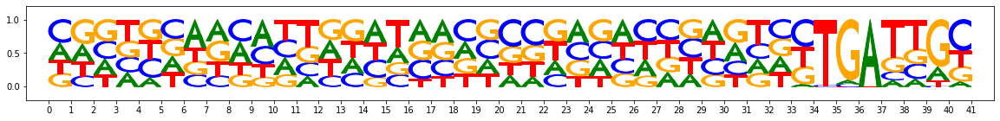

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.1517608761787415


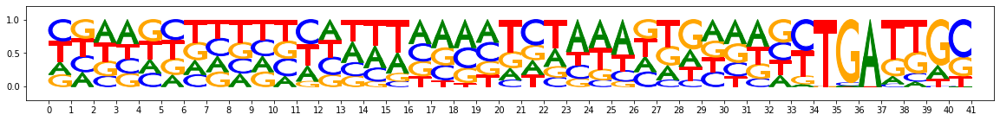

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.05059322234860432)
Coordinate:  example:761,start:538,end:579,rc:False
Contrib scores:


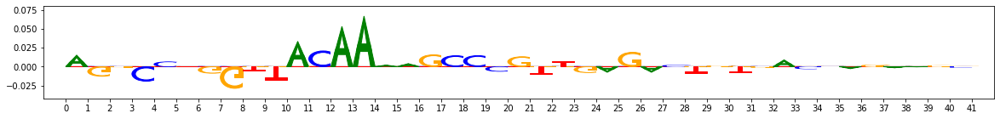

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 7.659532785415649


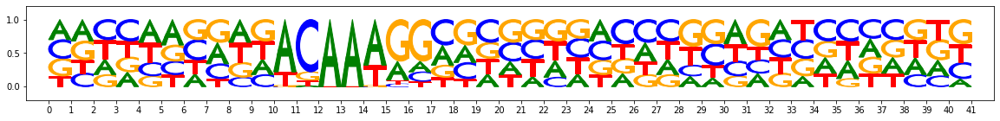

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 9.590450704097748


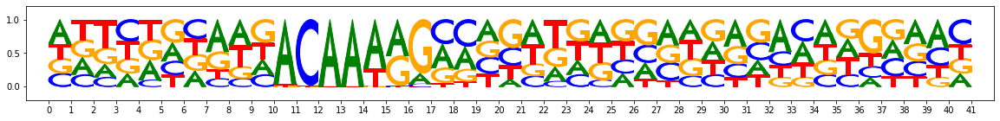

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.09561977696971537)
Coordinate:  example:538,start:456,end:497,rc:False
Contrib scores:


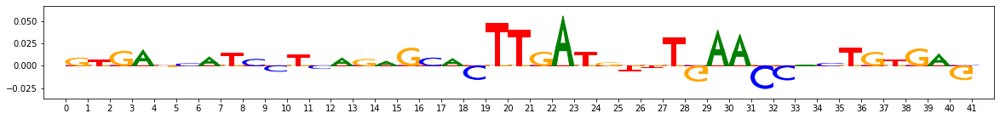

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 6.061904162168503


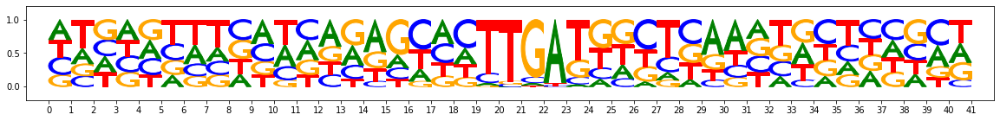

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 6.997036516666412


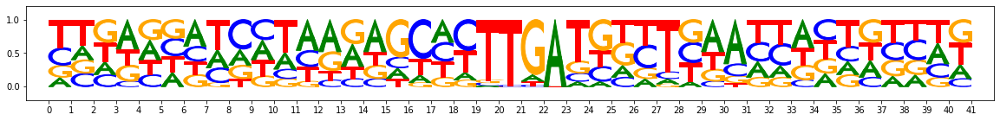

#######################
FILTERING PERCENTILE: 19.0
#######################
-----------
Filtered seqlet @ percentile, sorted via Information Content of 50 NN PFM (value: 4.919452041387558)
Coordinate:  example:363,start:605,end:646,rc:False
Contrib scores:


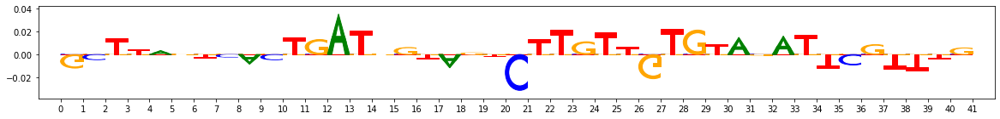

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.919452041387558


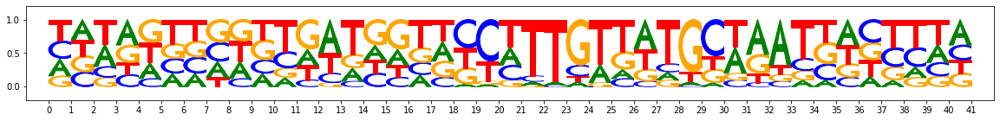

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.514679729938507


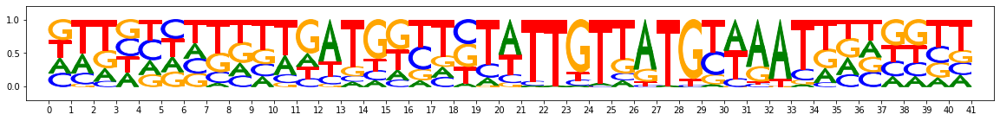

-----------
Filtered seqlet @ percentile, sorted via Total Importance (value: 0.20320277)
Coordinate:  example:466,start:440,end:481,rc:False
Contrib scores:


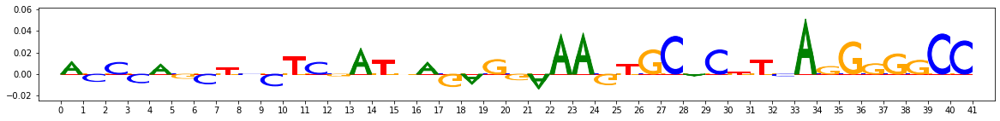

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.130071669816971


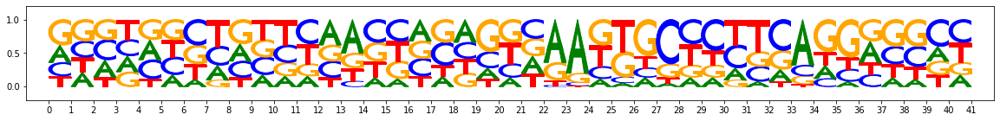

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.003830999135971


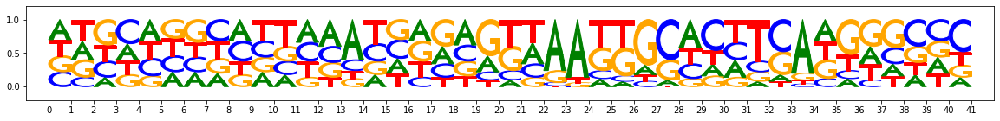

-----------
Filtered seqlet @ percentile, sorted via Conv Embedding Coarse-vs-Fine Sim Correlations (value: 0.054173056277882485)
Coordinate:  example:798,start:444,end:485,rc:False
Contrib scores:


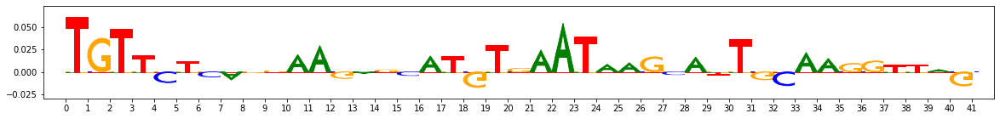

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 3.6474396884441376


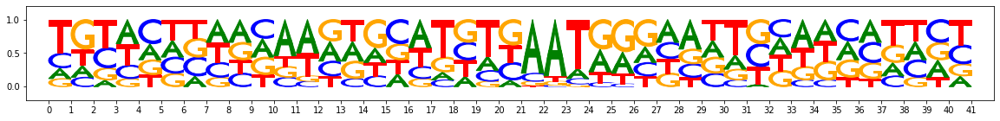

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 4.357015997171402


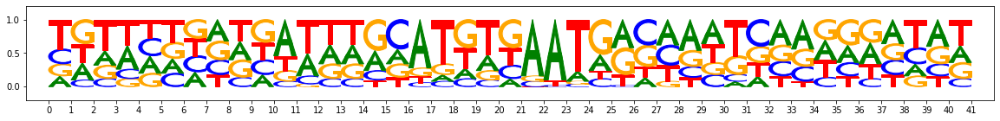

-----------
Filtered seqlet @ percentile, sorted via Gkm Coarse-vs-Fine Sim Correlations (value: 0.09903843545669865)
Coordinate:  example:77,start:507,end:548,rc:False
Contrib scores:


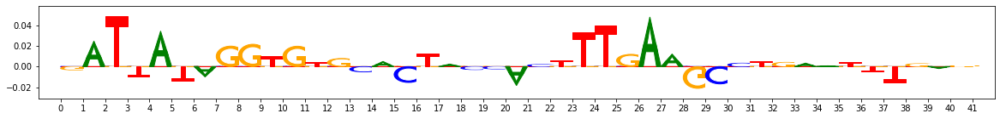

PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC 4.612450063228607


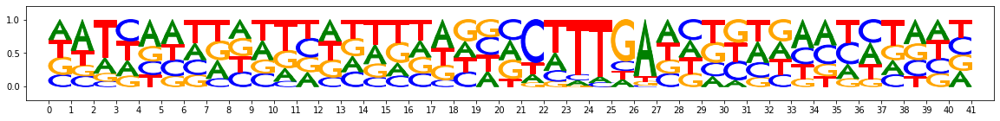

PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC 7.2682788372039795


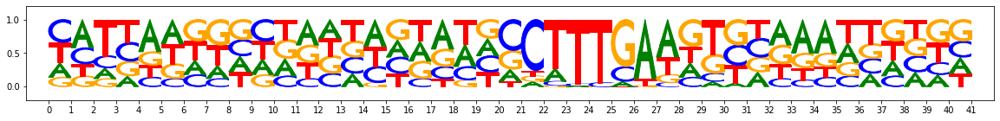

In [73]:
premotif_ics_argsort = np.argsort(premotif_ics)
correlations_argsort = np.argsort(correlations)
gkm_correlations_argsort = np.argsort(gkm_correlations)

seqlet_imps = np.array([np.sum(x["Nanog_profile_wn_contrib_scores"].fwd[10:31]) for x in seqlets])
argsort_totalimp = np.argsort(seqlet_imps)

from modisco.visualization import viz_sequence
steps=100
for i in range(20):
    print("#######################\nFILTERING PERCENTILE:",100*i/steps)
    print("#######################")
    argsort_idx_lookup = i*int(len(seqlets)/50)
    premotif_ics_idx = premotif_ics_argsort[argsort_idx_lookup]
    correlations_idx = correlations_argsort[argsort_idx_lookup]
    totalimp_idx = argsort_totalimp[argsort_idx_lookup]
    gkm_correlations_idx = gkm_correlations_argsort[argsort_idx_lookup]
    for seqlet_idx, rankingvals, idxtypename in [
        (premotif_ics_idx, premotif_ics, "Information Content of 50 NN PFM"),
        (totalimp_idx, seqlet_imps, "Total Importance"),
        (correlations_idx, correlations, "Conv Embedding Coarse-vs-Fine Sim Correlations"),
        (gkm_correlations_idx, gkm_correlations, "Gkm Coarse-vs-Fine Sim Correlations")]:
        print("-----------\nFiltered seqlet @ percentile, sorted via "+idxtypename+" (value: "+str(rankingvals[seqlet_idx])+")")
        print("Coordinate: ",seqlets[seqlet_idx].coor)
        print("Contrib scores:")
        viz_sequence.plot_weights(seqlets[seqlet_idx]["Nanog_profile_wn_contrib_scores"].fwd)
        print("PFM from 50 nearest seqlets (prefilt using conv embedding coarse-grained); IC "+str(premotif_ics[seqlet_idx]))
        viz_sequence.plot_weights(premotif_avgonehots[seqlet_idx])
        print("PFM from 50 nearest seqlets (prefilt using gkm embedding coarse-grained); IC "+str(gkm_premotif_ics[seqlet_idx]))
        viz_sequence.plot_weights(gkm_premotif_avgonehots[seqlet_idx])
    
    
#for i in premotif_ics_argsort[::int(len(seqlets)/50)]:
#    print(premotif_ics_argsort[i],
#          premotif_ics[premotif_ics_argsort[i]])
#    viz_sequence.plot_weights(
#        seqlets[premotif_ics_argsort[i]]
#               ["Nanog_profile_wn_contrib_scores"].fwd)

Number of seqlets 8719
Number of regions 1104
Filtering lowest 0


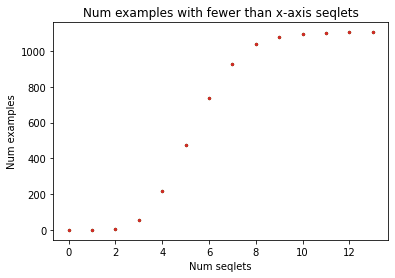

Filtering lowest 0.05


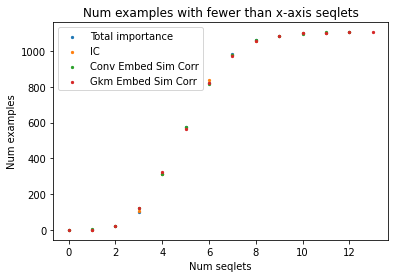

Filtering lowest 0.1


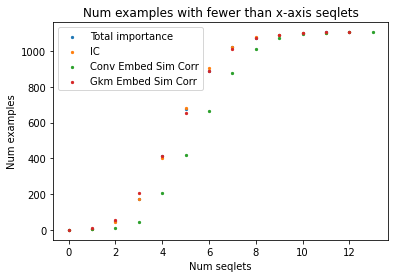

Filtering lowest 0.15


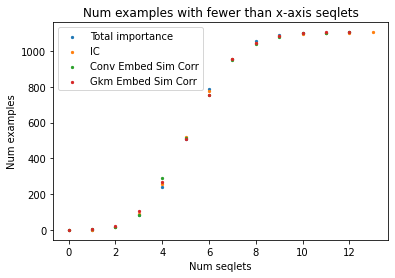

Filtering lowest 0.2


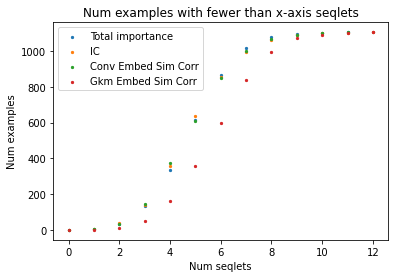

Filtering lowest 0.25


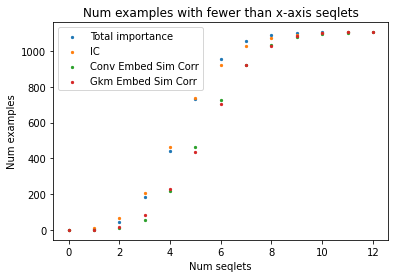

In [71]:
from matplotlib import pyplot as plt
from collections import Counter

#study seqlet distribution across examples
def get_seqlet_nums_per_ex(seqlets):
    #num_seqs_to_use
    seqlet_counts = np.zeros(NUM_SEQS_TO_USE)
    for seqlet in seqlets:
        seqlet_counts[seqlet.coor.example_idx] += 1
    return seqlet_counts

print("Number of seqlets", len(seqlets))
print("Number of regions", NUM_SEQS_TO_USE)

def get_seqletsperex_dist_for_different_argsorts(seqlets, argsort, frac_to_filt):
    seqlets_retained = [seqlets[i] for i in
                        argsort[int(len(argsort)*frac_to_filt):]]
    seqlet_counts = get_seqlet_nums_per_ex(seqlets_retained)
    num_ex_per_count = np.array([x[1] for x in sorted(Counter(seqlet_counts).items())])
    return num_ex_per_count
    

for frac_to_filt in [0, 0.05, 0.1, 0.15, 0.2, 0.25]:
    print("Filtering lowest",frac_to_filt)
    
    handles = []
    labels = []
    for argsort, sorting_crit_name in [(argsort_totalimp, "Total importance"),
                                        (premotif_ics_argsort, "IC"),
                                        (correlations_argsort, "Conv Embed Sim Corr"),
                                        (gkm_correlations_argsort, "Gkm Embed Sim Corr")]:
        labels.append(sorting_crit_name)        
        num_ex_per_count = get_seqletsperex_dist_for_different_argsorts(
            seqlets=seqlets, argsort=argsort, frac_to_filt=frac_to_filt)
        handles.append(plt.scatter(np.arange(len(num_ex_per_count)), np.cumsum(num_ex_per_count), s=5))
    
    plt.title("Num examples with fewer than x-axis seqlets")
    plt.ylabel("Num examples")
    plt.xlabel("Num seqlets")
    if (frac_to_filt > 0):
        plt.legend(handles, labels)
    plt.show()